In [58]:
import pandas as pd
import numpy as np
import cv2 as cv
from collections import defaultdict
from scipy import signal
import matplotlib.pyplot as plt
from math import pi
import os, scipy, glob
from scipy import fftpack, fft
from scipy.fftpack import fftshift, irfft, rfft 
from scipy.signal import blackman

get_ipython().magic('matplotlib inline')
"""
fname = '1_20200611_152306_White_Reg.csv'
#fname= '1_20200611_152318_Amber_Reg.csv'
#fname = '1_20200611_152334_Mixed_Reg.csv'
#x1 = pd.read_csv(fname)
gname = '/Users/estepark/Documents/week6_fri/Data/1_20200611_152306_White_Reg.csv'
Lv_csv = pd.read_csv(fname, skiprows=[0,*range(1362,4085)], header=None)

#Lv_csv = pd.read_csv(fname, skiprows=[0,*range(1294,3881)], header=None)
u_csv = pd.read_csv(fname, skiprows=[*range(0,1363), *range(2724,4085)], header=None)

#u_csv = pd.read_csv(fname, skiprows=[*range(0,1295), *range(2588,3882)], header=None)
v_csv = pd.read_csv(fname, skiprows=[*range(0,2725)], header=None)

#v_csv = pd.read_csv(fname, skiprows=[*range(0,2588)], header=None)
# u' = 1362
# v' = 2725


class Crosshatch(object):
    def __init__(self,x1): 
        assert isinstance(x1, pd.core.frame.DataFrame)
        #assert 'Lv' in x1
        self.x1 = x1
    def detect(self):
        pass
Lv = Crosshatch(Lv_csv)
u = Crosshatch(u_csv)
v = Crosshatch(v_csv)
#mode.detect()
"""

"\nfname = '1_20200611_152306_White_Reg.csv'\n#fname= '1_20200611_152318_Amber_Reg.csv'\n#fname = '1_20200611_152334_Mixed_Reg.csv'\n#x1 = pd.read_csv(fname)\ngname = '/Users/estepark/Documents/week6_fri/Data/1_20200611_152306_White_Reg.csv'\nLv_csv = pd.read_csv(fname, skiprows=[0,*range(1362,4085)], header=None)\n\n#Lv_csv = pd.read_csv(fname, skiprows=[0,*range(1294,3881)], header=None)\nu_csv = pd.read_csv(fname, skiprows=[*range(0,1363), *range(2724,4085)], header=None)\n\n#u_csv = pd.read_csv(fname, skiprows=[*range(0,1295), *range(2588,3882)], header=None)\nv_csv = pd.read_csv(fname, skiprows=[*range(0,2725)], header=None)\n\n#v_csv = pd.read_csv(fname, skiprows=[*range(0,2588)], header=None)\n# u' = 1362\n# v' = 2725\n\n\nclass Crosshatch(object):\n    def __init__(self,x1): \n        assert isinstance(x1, pd.core.frame.DataFrame)\n        #assert 'Lv' in x1\n        self.x1 = x1\n    def detect(self):\n        pass\nLv = Crosshatch(Lv_csv)\nu = Crosshatch(u_csv)\nv = Crosshatc

In [62]:
#short corsshatch plots
path= '/Users/estepark/Documents/week6_fri/Data/'
pathWrite = '/Users/estepark/Documents/week6_fri/short'
"""
Will output the rows of FFT scores, where plotRows are the actual rows you want to compare
"""
def subPlotShort(path, plotRows=[]):
    pixelIntensities = []
    fftAmps = []
    fnames = []
    for fname in (glob.glob(path+'/*.csv')) :
        Lv_csv = pd.read_csv(fname, skiprows=[0], header=None)
        for i in range(0,1500):
            # find element's index corresponding to u'
            if ( Lv_csv[0][i] =="u'" ): 
                # save all Lv matrix values until u' index
                Lvindex = int(np.where(Lv_csv == Lv_csv[0][i])[0] ) 
                break     # as soon as matched index valid, exit & search no further
        # concatenated Lv matrix that excludes u' and v' matrix in csv file
        Lv = np.array(Lv_csv[0: Lvindex], dtype="float32" ) 
        """
        INPUT == Short cross hatches
        FN == Short cross hatch search
        OUTPUT == ALL THE SUBPLOTS AND SHIET
        """
        # split the name of the csv as plt title
        spltName = fname.split('/')[-1][:-4] 
        #spltName = fname.split('/')[6]
        fnames.append(spltName)
        plt.figure()
        imgLv = np.array(Lv, dtype = "uint8") #cv2 for 8u and 32f images in function 'bilateralFilter'
        imgLvcopy = imgLv.copy()
        #cv.imread(Lv.x1)
        plt.title("Lv from csv file converted to image \n {}".format(spltName))
        plt.imshow(np.array(Lv), cmap="gray")
        plt.show()
        print('saving image to ',os.path.join(pathWrite, spltName+'.png'))
        print(np.max(Lv))
        print(np.min(Lv))
        print(Lv.shape)
        cv.imwrite(os.path.join(pathWrite, spltName+'.png'), cv.cvtColor(np.array(Lv), cv.COLOR_GRAY2RGB))
        testa = cv.imread(os.path.join(pathWrite, spltName+'.png'), cv.IMREAD_GRAYSCALE)
        print(testa.shape)
        plt.figure()
        plt.title('testing')
        plt.imshow(testa/255, cmap="gray")
        plt.show()

        # provide Scharr kernel
        kern = [[0, 1,  0], [1, 0, -1],[ 0, -1 ,0]]
        imgrayLv = cv.bilateralFilter(imgLv, 20, 75, 75)

        
        diag_imgLv= signal.convolve2d( Lv, np.array(kern) , boundary ='symm', mode='same')
        
        plt.figure()
        #plt.imshow(diag_imgLv, cmap = "gray")
        plt.imshow(diag_imgLv, cmap = "gray")
        plt.title("Scharr + LPF \n {}".format(spltName))
        plt.show()

        
        

        # scale back to [0,255], becuase convolve2d changes ranges [-2,+2]
        diag_cpy = (((diag_imgLv.copy()+2))/4*255).astype(np.uint8) #bc min=-2 and max=+2
        #print('max = {}, min = {}'.format(np.max(diag_cpy), np.min(diag_cpy)))  #confirm min/max
        #print(' diag shape = ',diag_cpy.shape) 
        edged = cv.Canny(diag_cpy, 160, 230)

        #sobelx = cv.Sobel(diag_cpy,cv.CV_64F,0,1,ksize=5)
        #plt.figure()
        #plt.imshow(diag_cpy)
        #plt.title('diag_cpy scaled to 0,255')
        #plt.show()
        #==================================================
        # perform short crosshatch # FFT scores vs. # row slice, around row #1200 should see period 
        #==================================================
        samplingFreq = 100
        samplingInterval = 1 / samplingFreq
        beginTime = 0
        print(imgLv.shape)
        """
        numRows == len of col is a 1360(height)x1020(width), then 1360==len of col == #of rows
        """
        numRows = imgLv.shape[0] 
        numCols = imgLv.shape[1]
        # for loop for short crosshatch is endTime = numCol
        freqRowSamps = np.linspace(0, numCols, numCols) # for short crosshatch
        endTime = numCols
        teim = np.arange(beginTime,endTime, 1)
        countPeaks = [] 
        score = []
        print("numrows: {}" .format(imgLv.shape[0]))
        print("numCols: {}" .format(imgLv.shape[1]))

        filePixelIntensities = []
        fileFftAmps = []
        #for i in range(numRows):
        for i in plotRows: 
            count = 1

            # for every i'th row, slice all columns [i,:]: => and append into amplitude 
            amplitude = imgrayLv[i,:] # ampltiude == # of cols, for short crosshatch
            filePixelIntensities.append(amplitude)
            #================================================================================
            #time domain representation for CrossHatch periodic signal
            #================================================================================
#             plt.figure()
#             plt.title('Row #%s' % (i) + " Spatial Intensity vs. Pixel distance \n{}".format(spltName) )
#             plt.xlabel('Pixel Distance along x-axis ')
#             plt.ylabel('Pixel intensity of Lv mat [Nits]')
#             plt.plot(amplitude)

            #=================================================================================
            #frequency domain of short CrossHatch
            # ---->https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html
            #=================================================================================
#             plt.figure()
            X = fftpack.fft(amplitude)
            fileFftAmps.append(np.abs(X))
#             amplitude1 = fftpack.fftfreq(len(amplitude))*samplingFreq
        
#             plt.title('Row #%s' % (i) + " Abs FFT Magnitude vs. Frequency \n{}".format(spltName) )
#             plt.xlabel('Frequency along x-axis [cycles/image]')
#             plt.ylabel('Abs amplitude FFT')
#             plt.xlim(-1, samplingFreq / 1.2)
#             plt.ylim(-1, 2000)
#             plt.stem(freqRowSamps, np.abs(X), use_line_collection = True) 

            #=================================================================================
            #count number of peaks that surpass that threshold, dont xlim ylim
            #plt.subplots_adjust ( hspace = 3)     
            # https://pythonawesome.com/overview-of-the-peaks-dectection-algorithms-available-in-python/
            #=================================================================================
            #freqPeaks = scipy.signal.find_peaks( np.abs(X) , height=[375, 750] )
            
            #indexPeaks = freqPeaks[0]
            #heightPeaks = np.array(list(freqPeaks[1].values()) , dtype = object)
            #heightPeaks = heightPeaks[0]            

            #plt.figure()            
            #plt.ylabel('Abs amplitude FFT')
            #plt.xlabel('Frequency along x-axis  [cycles/image]')
            #plt.xlim(-1, samplingFreq / 1.2)
            #plt.ylim(-1, 600)
            #plt.title('Row #%s' % (i) + " total Peaks in fft thresh \n{}".format(spltName) )
            #if heightPeaks.size > 0:
                #plt.stem(indexPeaks,heightPeaks, use_line_collection=True)
                #countPeaks.append(len(heightPeaks))
                #plt.show()
            #else:
                #countPeaks.append(0)
                #plt.show()
        #print("numrows: {}" .format(imgLv.shape[0]))
        #print("numCols: {}" .format(imgLv.shape[1]))
        #print("important")
        #print('score short-crosshatch is ' + str(len(countPeaks)))

        #isCrossHatch = sum(countPeaks)
        #score.append(isCrossHatch)
        #plt.figure()
        #plt.plot(countPeaks,'bo')
        #plt.xlabel('pixel location along short x-axis')
        #plt.ylabel('total number of peaks in FFT slice')
        #plt.title('sum of FFT peaks vs. pixel location x-axis \n{}'.format(spltName))
        #plt.show()


        # perform long crosshatch
        pixelIntensities.append(filePixelIntensities)
        fftAmps.append(fileFftAmps)
    
    #pixelIntensities = np.array(pixelIntensities)
    #fftAmps = np.array(fftAmps)
    
    plt.figure()
    fig, ax = plt.subplots(len(plotRows), 2,figsize=(20,25))
    for j, row in enumerate(plotRows): 
        for k in range(len(fnames)): 
            ax[j, 0].plot(pixelIntensities[k][j], label='{}'.format(fnames[k])) 
            ax[j, 1].stem(fftAmps[k][j], label='{}'.format(fnames[k]), use_line_collection=True, markerfmt='C{}o'.format(k),linefmt='C{}-'.format(k))
        ax[j,0].set_title('Row #{}'.format(row) + " Spatial Intensity vs. Pixel distance ", fontsize=20 )
        ax[j,0].set_xlabel('Pixel Distance along x-axis ' , fontsize=18)
        ax[j,0].set_ylabel('Pixel intensity of Lv mat [Nits]',fontsize=18)

        ax[j,0].legend()
        
        ax[j,1].set_title('Row #{}'.format(row) + " Abs FFT Magnitude vs. Frequency ", fontsize=20)
        ax[j,1].set_xlabel('Frequency along x-axis [cycles/image]',fontsize=18)
        ax[j,1].set_ylabel('Abs amplitude FFT',fontsize=18)
        ax[j,1].set_xlim(-1, samplingFreq / 2)
        ax[j,1].set_ylim(-1, 2000)

        ax[j,1].legend()
    fig.tight_layout()
    plt.show()


    



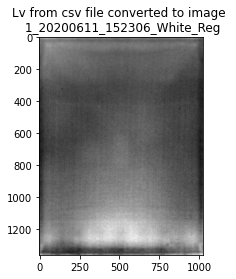

saving image to  /Users/estepark/Documents/week6_fri/short/1_20200611_152306_White_Reg.png
119.681
85.805
(1360, 1020)
(1360, 1020)


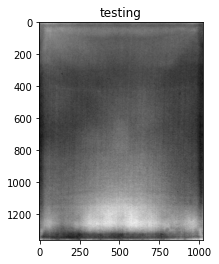

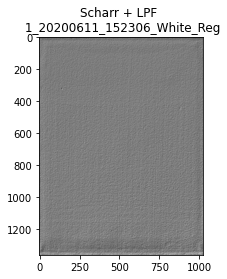

(1360, 1020)
numrows: 1360
numCols: 1020


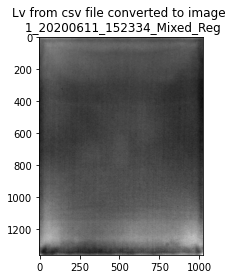

saving image to  /Users/estepark/Documents/week6_fri/short/1_20200611_152334_Mixed_Reg.png
107.646
71.103
(1360, 1020)
(1360, 1020)


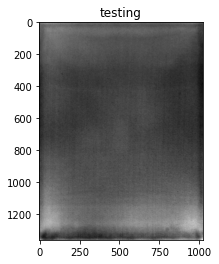

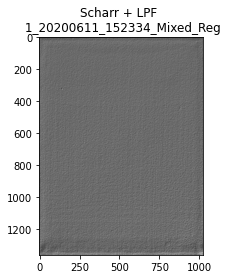

(1360, 1020)
numrows: 1360
numCols: 1020


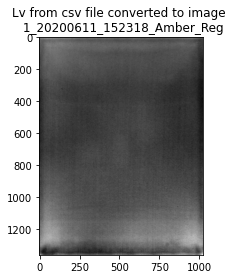

saving image to  /Users/estepark/Documents/week6_fri/short/1_20200611_152318_Amber_Reg.png
119.096
76.839
(1360, 1020)
(1360, 1020)


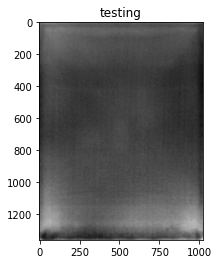

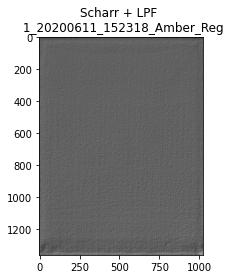

(1360, 1020)
numrows: 1360
numCols: 1020


<Figure size 432x288 with 0 Axes>

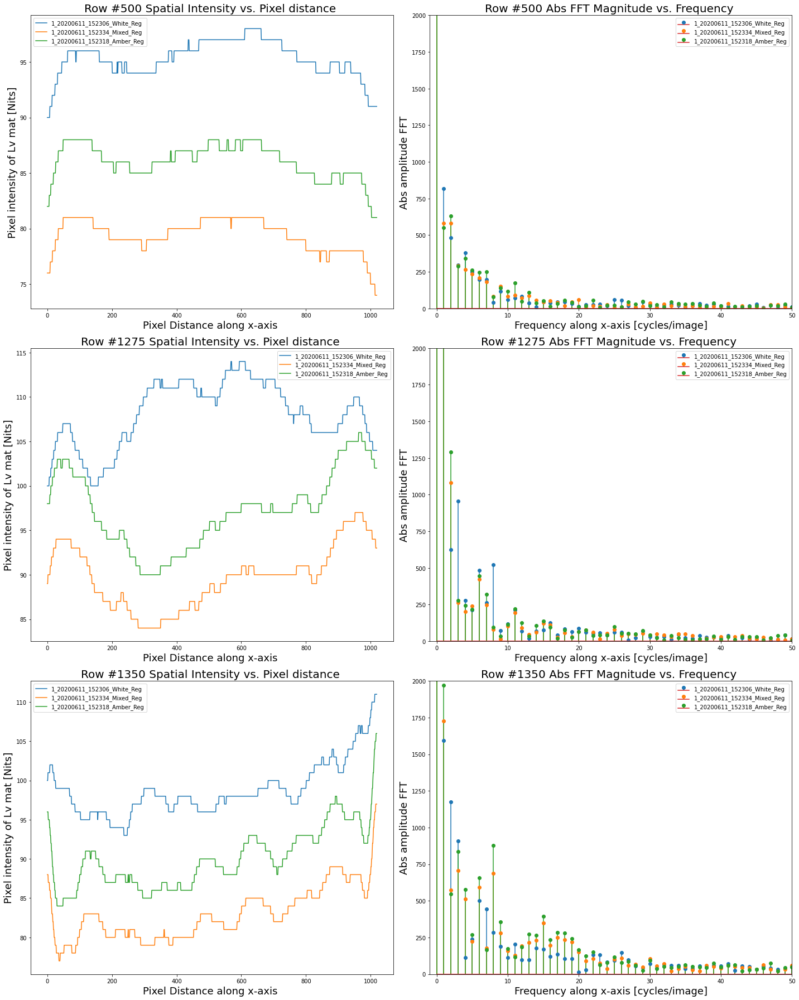

In [63]:
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
subPlotShort(path, plotRows=[500, 1275, 1350])

In [88]:
# long crosshatch plots SUBPLOTS FOR FINDING THE THRESHOLD
"""
will output the score of each image in scores of ea short crosshatch image as return value of array
"""

path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
def subPlotPlotShort(path, plotRows=[]):
    pixelIntensities = []
    fftAmps = []
    fnames = []
    count = []
    imgShortScore = []
    for fname in (glob.glob(path+'/*.csv') or glob.glob(path+'/*.CSV')) :
        Lv_csv = pd.read_csv(fname, skiprows=[0], header=None)
        for i in range(0,1500):
            # find element's index corresponding to u'
            if ( Lv_csv[0][i] =="u'" ): 
                # save all Lv matrix values until u' index
                Lvindex = int(np.where(Lv_csv == Lv_csv[0][i])[0] ) 
                break     # as soon as matched index valid, exit & search no further
        # concatenated Lv matrix that excludes u' and v' matrix in csv file
        Lv = np.array(Lv_csv[0: Lvindex], dtype="float32" ) 
        """
        INPUT == Short cross hatches
        FN == Short cross hatch search
        OUTPUT == ALL THE SUBPLOTS AND SHIET
        """
        # split the name of the csv as plt title
        spltName = fname.split('/')[-1][:-4] 
        fnames.append(spltName)
        #plt.figure()
        imgLv = np.array(Lv, dtype = "uint8") #cv2 for 8u and 32f images in function 'bilateralFilter'
        imgLvcopy = imgLv.copy()
        #cv.imread(Lv.x1)
        #plt.title("Lv from csv file converted to image \n {}".format(spltName))
        #plt.imshow(np.array(Lv), cmap="gray")
        #plt.show()

        # provide Scharr kernel
        kern = [[0, 1,  0], [1, 0, -1],[ 0, -1 ,0]]
        imgrayLv = cv.bilateralFilter(imgLv, 20, 75, 75)
        diag_imgLv= signal.convolve2d(imgrayLv, np.array(kern) , boundary ='symm', mode='same')
        #plt.figure()
        #plt.imshow(diag_imgLv, cmap = "gray")
        #plt.title("Scharr + LPF \n {}".format(spltName))
        #plt.show()

        # scale back to [0,255], becuase convolve2d changes ranges [-2,+2]
        diag_cpy = (((diag_imgLv.copy()+2))/4*255).astype(np.uint8) #bc min=-2 and max=+2
        #print('max = {}, min = {}'.format(np.max(diag_cpy), np.min(diag_cpy)))  #confirm min/max
        #print(' diag shape = ',diag_cpy.shape) 
        edged = cv.Canny(diag_cpy, 160, 230)

        samplingFreq = 100
        samplingInterval = 1 / samplingFreq
        beginTime = 0
        #print(imgLv.shape)
        """
        numRows == len of col is a 1360(height)x1020(width), then 1360==len of col == #of rows
        """
        numRows = imgLv.shape[0] 
        numCols = imgLv.shape[1]
        # for loop for short crosshatch is endTime = numCol
        #freqRowSamps = np.linspace(0, numCols, numCols) # for short crosshatch
        freqRowSamps = np.linspace(0, numRows, numRows) # for short crosshatch
        endTime = numCols
        teim = np.arange(beginTime,endTime, 1)
        countPeaks = [] 
        score = []
        #print("numrows: {}" .format(imgLv.shape[0]))
        #print("numCols: {}" .format(imgLv.shape[1]))

        filePixelIntensities = []
        fileFftAmps = []
        for i in range(numRows):
        #for i in plotRows: 
            # for every i'th row, slice all columns [i,:]: => and append into amplitude 
            amplitude = imgrayLv[i,:] # ampltiude == # of cols, for short crosshatch
            #amplitude = imgrayLv[:,i] # ampltiude == # of cols, for short crosshatch
            filePixelIntensities.append(amplitude)
            #================================================================================
            #time domain representation for CrossHatch periodic signal
            #================================================================================
            #plt.figure()
            #plt.title('Row #%s' % (i) + " Spatial Intensity vs. Pixel distance \n{}".format(spltName) )
            #plt.xlabel('Pixel Distance along x-axis ')
            #plt.ylabel('Pixel intensity of Lv mat [Nits]')
            #plt.plot(amplitude)

            #=================================================================================
            #frequency domain of short CrossHatch
            # ---->https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html
            #=================================================================================
            #plt.figure()
            X = fftpack.fft(amplitude)
            fileFftAmps.append(np.abs(X))
            amplitude1 = fftpack.fftfreq(len(amplitude))*samplingFreq
        
            #plt.title('Row #%s' % (i) + " Abs FFT Magnitude vs. Frequency \n{}".format(spltName) )
            #plt.xlabel('Frequency along x-axis [cycles/image]')
            #plt.ylabel('Abs amplitude FFT')
            #plt.xlim(-1, samplingFreq / 2)
            #plt.ylim(-1, 4000)
            #plt.stem(freqRowSamps, np.abs(X), use_line_collection = True) 

            #=================================================================================
            #count number of peaks that surpass that threshold, dont xlim ylim
            #plt.subplots_adjust ( hspace = 3)     
            # https://pythonawesome.com/overview-of-the-peaks-dectection-algorithms-available-in-python/
            #=================================================================================
            freqPeaks = scipy.signal.find_peaks( np.abs(X) , distance=1, width=0, height=[250, 3000] )
            
            indexPeaks = freqPeaks[0]
            heightPeaks = freqPeaks[1]['peak_heights']
           

            if heightPeaks.size > 0:
                #plt.stem(indexPeaks,heightPeaks, use_line_collection=True)
                countPeaks.append(heightPeaks)
                #plt.show()
            else:
                countPeaks.append([0])

        countPeaks = np.array(countPeaks) 
        isCrossHatch = np.hstack(countPeaks) #flattend last of countPeaks
        

        
        score = sum(isCrossHatch)
        imgShortScore.append(score)
        
        #print("score is {}".format(score))
        sumCols = [np.sum(cp) for cp in countPeaks]
        count.append(sumCols)
        
    """
    plt.plot(count[0],'--', color='blue')
    plt.plot(count[1],'--', color='orange')
    plt.plot(count[2],'--', color = 'green')
    plt.xlabel('Row number')
    plt.ylabel('Sum of FFT magnitude')
    plt.title('Sum of FFT magnitudes vs. Row number')
    plt.legend(labels = ['1_20200611_152306_White_Reg','1_20200611_152334_Mixed_Reg','1_20200611_152318_Amber_Reg'],loc="upper left")
    plt.show()
    """
    return imgShortScore
"""
        # perform long crosshatch
        pixelIntensities.append(np.array(filePixelIntensities))
        fftAmps.append(np.array(fileFftAmps))
    
    #pixelIntensities = np.array(pixelIntensities)
    #fftAmps = np.array(fftAmps)
    
    plt.figure()
    fig, ax = plt.subplots(len(plotRows), 2,figsize=(20,25))
    for j, row in enumerate(plotRows): 
        for k in range(len(fnames)): 
            ax[j, 0].plot(pixelIntensities[k][j], label='{}'.format(fnames[k])) 
            ax[j, 1].stem(fftAmps[k][j], label='{}'.format(fnames[k]), use_line_collection=True, markerfmt='C{}o'.format(k),linefmt='C{}-'.format(k))
        ax[j,0].set_title('Row #{}'.format(row) + " Spatial Intensity vs. Pixel distance ", fontsize=20 )
        ax[j,0].set_xlabel('Pixel Distance along x-axis ' , fontsize=18)
        ax[j,0].set_ylabel('Pixel intensity of Lv mat [Nits]',fontsize=18)

        ax[j,0].legend()
        
        ax[j,1].set_title('Row #{}'.format(row) + " Abs FFT Magnitude vs. Frequency ", fontsize=20)
        ax[j,1].set_xlabel('Frequency along x-axis [cycles/image]',fontsize=18)
        ax[j,1].set_ylabel('Abs amplitude FFT',fontsize=18)
        ax[j,1].set_xlim(-1, samplingFreq / 2)
        ax[j,1].set_ylim(-1, 2000)

        ax[j,1].legend()
    fig.tight_layout()
    plt.show()


    

"""
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
subPlotPlotShort(path, plotRows=[0, 100, 700])




[938771.5961060538, 1508610.7105980816, 874208.1044488084]

In [65]:
# long crosshatch plots
import math
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
"""
Will output the COLUMNS of FFT scores, where plotCols are the actual col ffts you want to compare
"""
def subPlotLong(path, plotRows=[], ):
    pixelIntensities = []
    fftAmps = []
    fnames = []
    for fname in (glob.glob(path+'/*.csv')) :
        Lv_csv = pd.read_csv(fname, skiprows=[0], header=None)
        for i in range(0,1500):
            # find element's index corresponding to u'
            if ( Lv_csv[0][i] =="u'" ): 
                # save all Lv matrix values until u' index
                Lvindex = int(np.where(Lv_csv == Lv_csv[0][i])[0] ) 
                break     # as soon as matched index valid, exit & search no further
        # concatenated Lv matrix that excludes u' and v' matrix in csv file
        Lv = np.array(Lv_csv[0: Lvindex], dtype="float32" ) 
        """
        INPUT == Short cross hatches
        FN == Short cross hatch search
        OUTPUT == ALL THE SUBPLOTS AND SHIET
        """
        # split the name of the csv as plt title
        spltName = fname.split('/')[-1][:-4] 
        fnames.append(spltName)
        plt.figure()
        imgLv = np.array(Lv, dtype = "uint8") #cv2 for 8u and 32f images in function 'bilateralFilter'
        imgLvcopy = imgLv.copy()
        #cv.imread(Lv.x1)
        plt.title("Lv from csv file converted to image \n {}".format(spltName))
        plt.imshow(np.array(Lv), cmap="gray")
        plt.show()

        # provide Scharr kernel
        kern = [[0, 1,  0], [1, 0, -1],[ 0, -1 ,0]]
        imgrayLv = cv.bilateralFilter(imgLv, 15, 75, 75)
        diag_imgLv= signal.convolve2d(imgrayLv, np.array(kern) , boundary ='symm', mode='same')
        plt.figure()
        plt.imshow(diag_imgLv, cmap = "gray")
        plt.title("Scharr + LPF \n {}".format(spltName))
        plt.show()

        # scale back to [0,255], becuase convolve2d changes ranges [-2,+2]
        diag_cpy = (((diag_imgLv.copy()+2))/4*255).astype(np.uint8) #bc min=-2 and max=+2
        #print('max = {}, min = {}'.format(np.max(diag_cpy), np.min(diag_cpy)))  #confirm min/max
        #print(' diag shape = ',diag_cpy.shape) 
        edged = cv.Canny(diag_cpy, 160, 230)

        #sobelx = cv.Sobel(diag_cpy,cv.CV_64F,0,1,ksize=5)
        #plt.figure()
        #plt.imshow(diag_cpy)
        #plt.title('diag_cpy scaled to 0,255')
        #plt.show()
        #==================================================
        # perform short crosshatch # FFT scores vs. # row slice, around row #1200 should see period 
        #==================================================
        samplingFreq = 100
        samplingInterval = 1 / samplingFreq
        beginTime = 0
        print(imgLv.shape)
        """
        numRows == len of col is a 1360(height)x1020(width), then 1360==len of col == #of rows
        """
        numRows = imgLv.shape[0] 
        numCols = imgLv.shape[1]
        # for loop for short crosshatch is endTime = numCol
        #freqRowSamps = np.linspace(0, numCols, numCols) # for short crosshatch
        freqRowSamps = np.linspace(0, numRows, numRows) # for short crosshatch
        endTime = numRows
        teim = np.arange(beginTime,endTime, 1)
        countPeaks = [] 
        score = []
        print("numrows: {}" .format(imgLv.shape[0]))
        print("numCols: {}" .format(imgLv.shape[1]))
        filePixelIntensities = []
        fileFftAmps = []
        #for i in range(numRows):
        for i in plotRows: 
            count = 1

            # for every i'th row, slice all columns [i,:]: => and append into amplitude 
            #amplitude = imgrayLv[i,:] # ampltiude == # of cols, for short crosshatch
            amplitude = imgrayLv[:,i] # ampltiude == # of cols, for short crosshatch
            filePixelIntensities.append(amplitude)
            #================================================================================
            #time domain representation for CrossHatch periodic signal
            #================================================================================
#             plt.figure()
#             plt.title('Row #%s' % (i) + " Spatial Intensity vs. Pixel distance \n{}".format(spltName) )
#             plt.xlabel('Pixel Distance along x-axis ')
#             plt.ylabel('Pixel intensity of Lv mat [Nits]')
#             plt.plot(amplitude)

            #=================================================================================
            #frequency domain of short CrossHatch
            # ---->https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html
            #=================================================================================
#             plt.figure()
            X = fftpack.fft(amplitude)
            fileFftAmps.append(np.abs(X))
#             amplitude1 = fftpack.fftfreq(len(amplitude))*samplingFreq
        
#             plt.title('Row #%s' % (i) + " Abs FFT Magnitude vs. Frequency \n{}".format(spltName) )
#             plt.xlabel('Frequency along x-axis [cycles/image]')
#             plt.ylabel('Abs amplitude FFT')
#             plt.xlim(-1, samplingFreq / 1.2)
#             plt.ylim(-1, 2000)
#             plt.stem(freqRowSamps, np.abs(X), use_line_collection = True) 

            #=================================================================================
            #count number of peaks that surpass that threshold, dont xlim ylim
            #plt.subplots_adjust ( hspace = 3)     
            # https://pythonawesome.com/overview-of-the-peaks-dectection-algorithms-available-in-python/
            #=================================================================================
            #freqPeaks = scipy.signal.find_peaks( np.abs(X) , height=[375, 750] )
            
            #indexPeaks = freqPeaks[0]
            #heightPeaks = np.array(list(freqPeaks[1].values()) , dtype = object)
            #heightPeaks = heightPeaks[0]            

            #plt.figure()            
            #plt.ylabel('Abs amplitude FFT')
            #plt.xlabel('Frequency along x-axis  [cycles/image]')
            #plt.xlim(-1, samplingFreq / 1.2)
            #plt.ylim(-1, 600)
            #plt.title('Row #%s' % (i) + " total Peaks in fft thresh \n{}".format(spltName) )
            #if heightPeaks.size > 0:
                #plt.stem(indexPeaks,heightPeaks, use_line_collection=True)
                #countPeaks.append(len(heightPeaks))
                #plt.show()
            #else:
                #countPeaks.append(0)
                #plt.show()
        #print("numrows: {}" .format(imgLv.shape[0]))
        #print("numCols: {}" .format(imgLv.shape[1]))
        #print("important")
        #print('score short-crosshatch is ' + str(len(countPeaks)))

        #isCrossHatch = sum(countPeaks)
        #score.append(isCrossHatch)
        #plt.figure()
        #plt.plot(countPeaks,'bo')
        #plt.xlabel('pixel location along short x-axis')
        #plt.ylabel('total number of peaks in FFT slice')
        #plt.title('sum of FFT peaks vs. pixel location x-axis \n{}'.format(spltName))
        #plt.show()
       
        # perform long crosshatch
        pixelIntensities.append(np.array(filePixelIntensities))
        fftAmps.append(np.array(fileFftAmps))
    
    #pixelIntensities = np.array(pixelIntensities)
    #fftAmps = np.array(fftAmps)
    
    plt.figure()
    fig, ax = plt.subplots(len(plotRows), 2,figsize=(20,25))
    for j, row in enumerate(plotRows): 
        for k in range(len(fnames)): 
            ax[j, 0].plot(pixelIntensities[k][j], label='{}'.format(fnames[k])) 
            ax[j, 1].stem(fftAmps[k][j], label='{}'.format(fnames[k]), use_line_collection=True, markerfmt='C{}o'.format(k),linefmt='C{}-'.format(k))
        ax[j,0].set_title('Column #{}'.format(row) + " Spatial Intensity vs. Pixel distance ", fontsize=20 )
        ax[j,0].set_xlabel('Pixel Distance along y-axis ' , fontsize=18)
        ax[j,0].set_ylabel('Pixel intensity of Lv mat [Nits]',fontsize=18)

        ax[j,0].legend()
        
        ax[j,1].set_title('Column #{}'.format(row) + " Abs FFT Magnitude vs. Frequency ", fontsize=20)
        ax[j,1].set_xlabel('Frequency along y-axis [cycles/image]',fontsize=18)
        ax[j,1].set_ylabel('Abs amplitude FFT',fontsize=18)
        ax[j,1].set_xlim(-1, samplingFreq/2)
        ax[j,1].set_ylim(-1, 3000)

        ax[j,1].legend()
    fig.tight_layout()
    plt.show()


    





/Users/estepark/Library/Python/3.7/lib/python/site-packages/IPython/core/interactiveshell.py:3263: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/Users/estepark/Library/Python/3.7/lib/python/site-packages/pandas/core/ops/array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


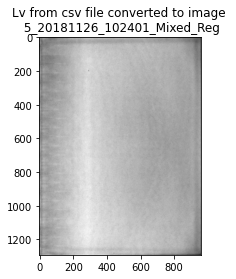

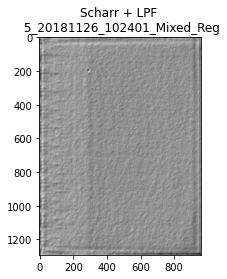

(1292, 962)
numrows: 1292
numCols: 962


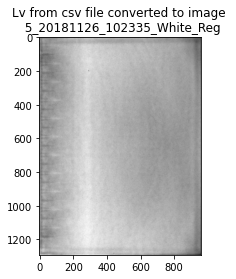

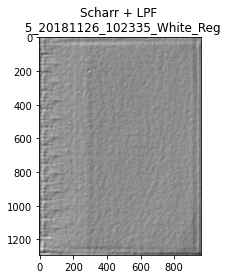

(1292, 962)
numrows: 1292
numCols: 962


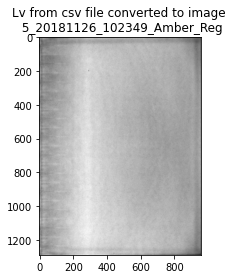

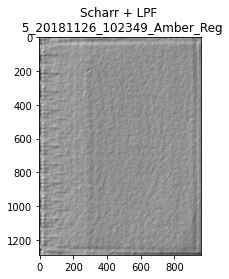

(1290, 961)
numrows: 1290
numCols: 961


<Figure size 432x288 with 0 Axes>

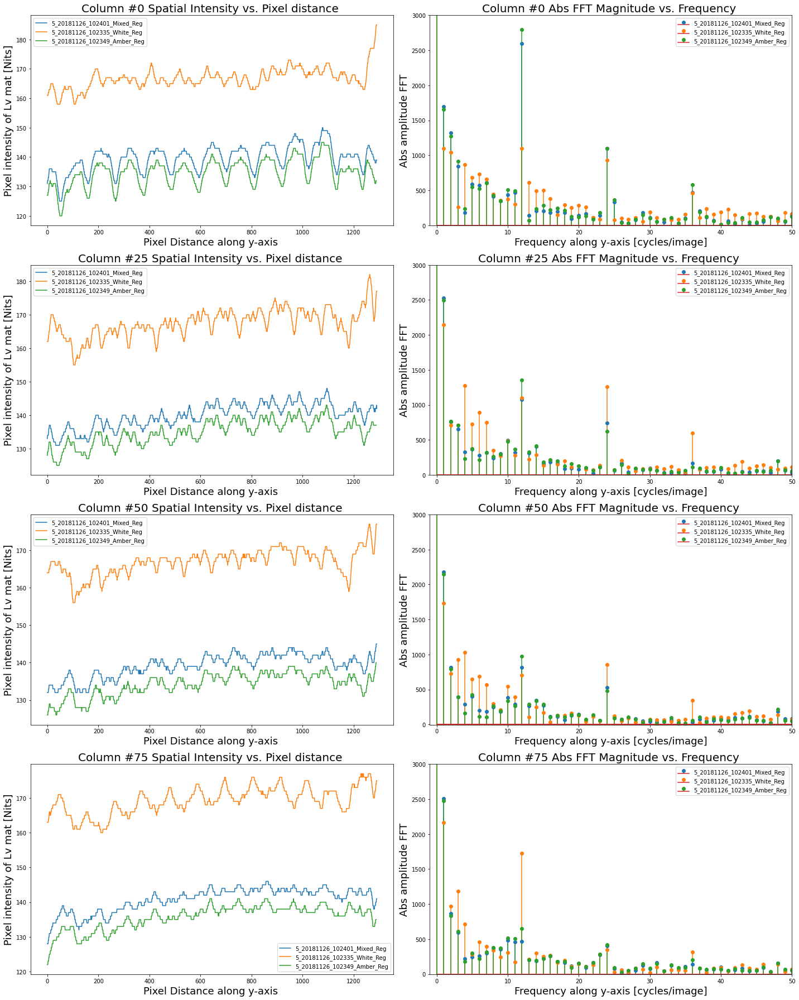

In [84]:
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
subPlotLong(path, plotRows=[0, 25, 50, 75])

/Users/estepark/Library/Python/3.7/lib/python/site-packages/IPython/core/interactiveshell.py:3263: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
/Users/estepark/Library/Python/3.7/lib/python/site-packages/pandas/core/ops/array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


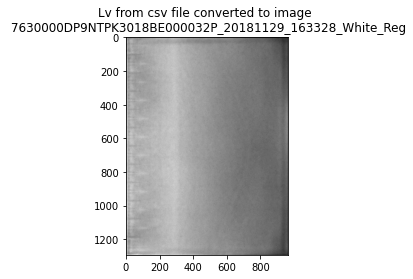

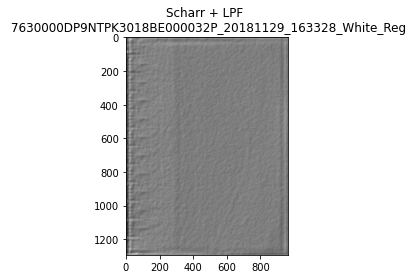

(1293, 963)
numrows: 1293
numCols: 963


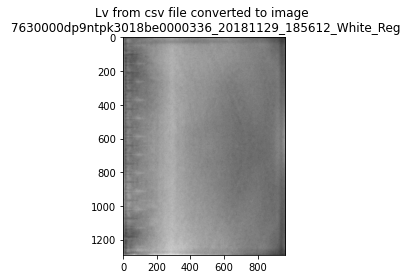

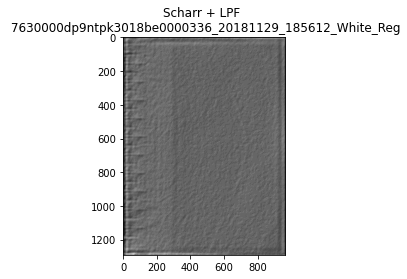

(1291, 962)
numrows: 1291
numCols: 962


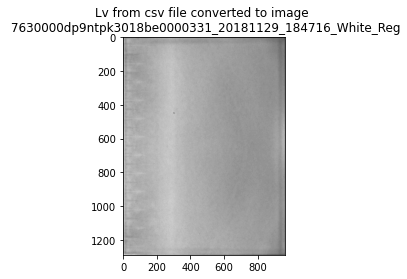

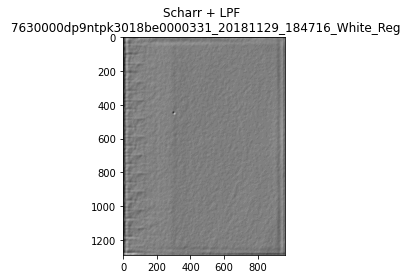

(1290, 961)
numrows: 1290
numCols: 961


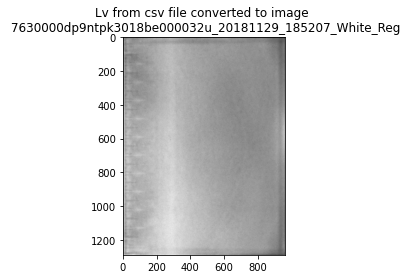

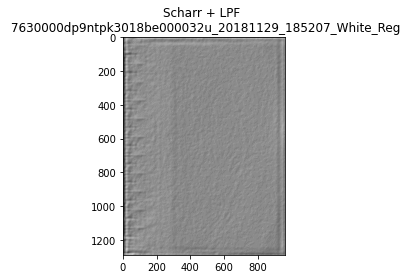

(1290, 961)
numrows: 1290
numCols: 961


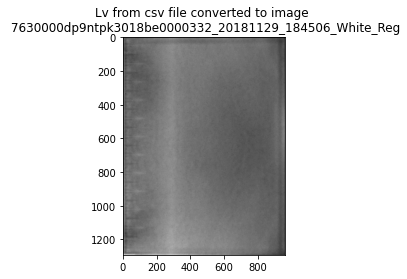

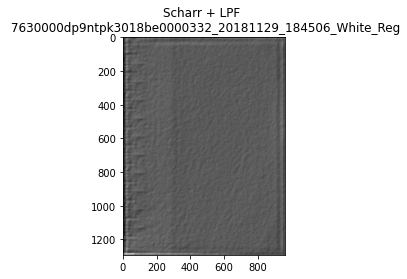

(1292, 962)
numrows: 1292
numCols: 962


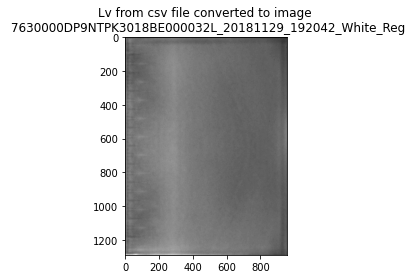

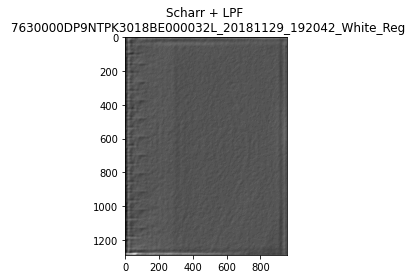

(1289, 960)
numrows: 1289
numCols: 960


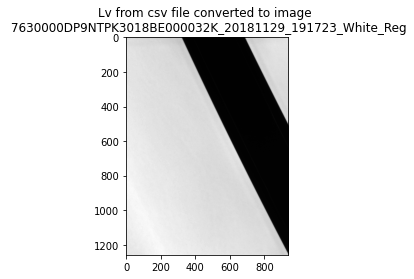

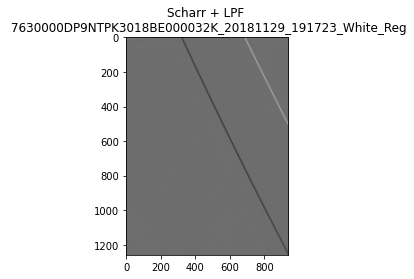

(1259, 938)
numrows: 1259
numCols: 938


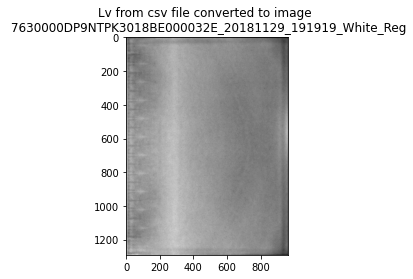

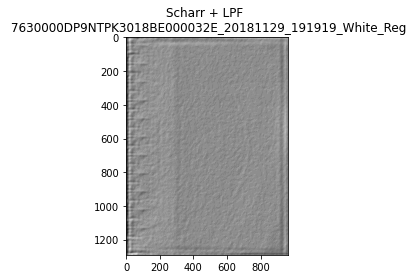

(1291, 961)
numrows: 1291
numCols: 961


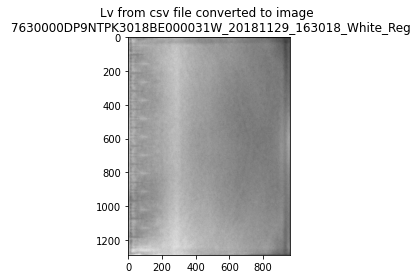

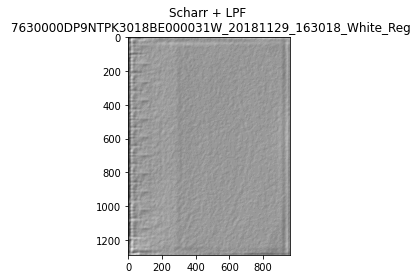

(1290, 961)
numrows: 1290
numCols: 961


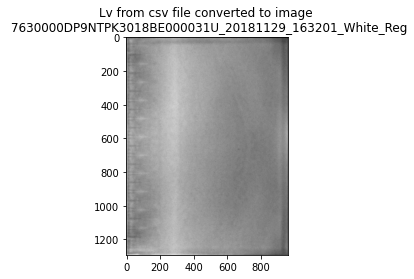

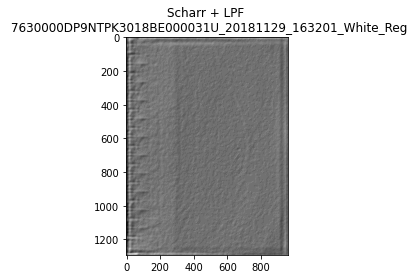

(1292, 962)
numrows: 1292
numCols: 962


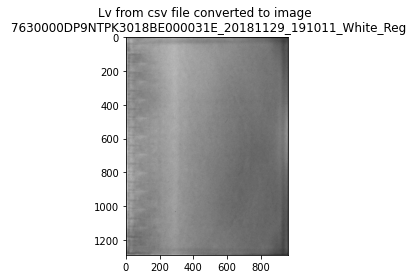

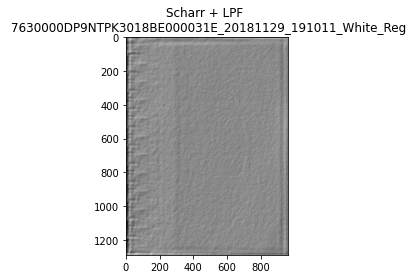

(1290, 961)
numrows: 1290
numCols: 961


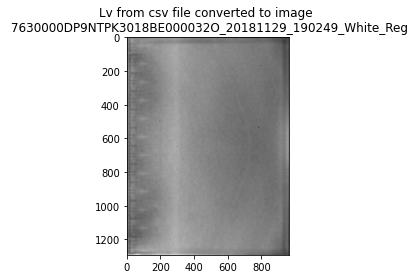

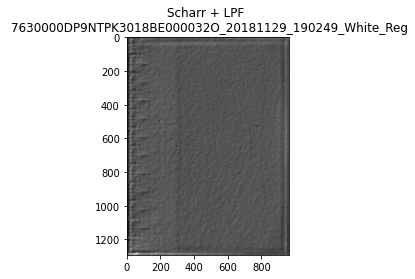

(1292, 962)
numrows: 1292
numCols: 962


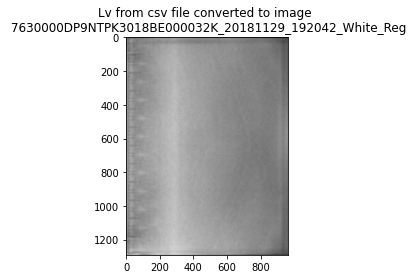

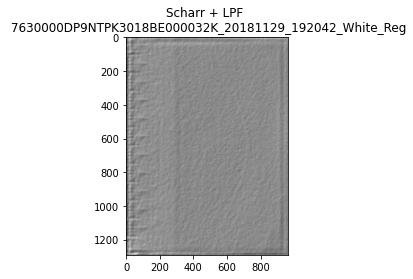

(1291, 961)
numrows: 1291
numCols: 961


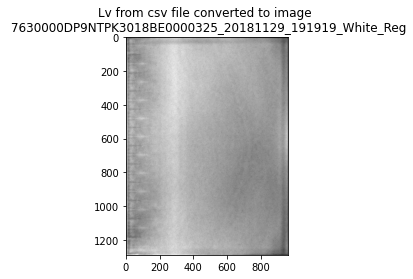

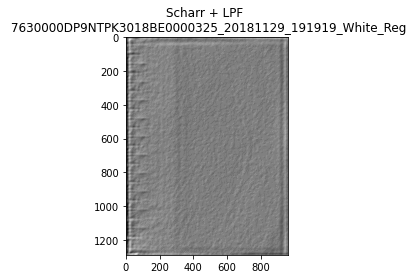

(1290, 961)
numrows: 1290
numCols: 961


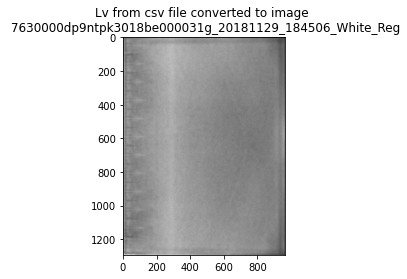

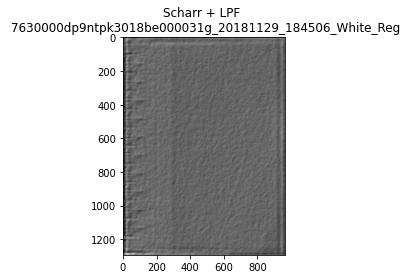

(1293, 963)
numrows: 1293
numCols: 963


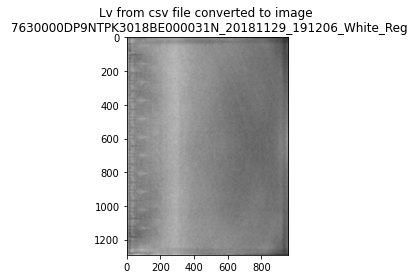

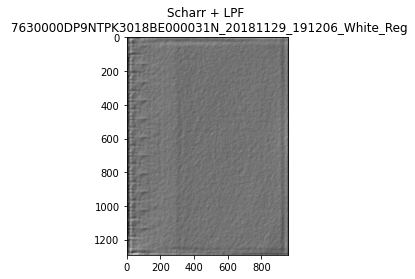

(1291, 961)
numrows: 1291
numCols: 961


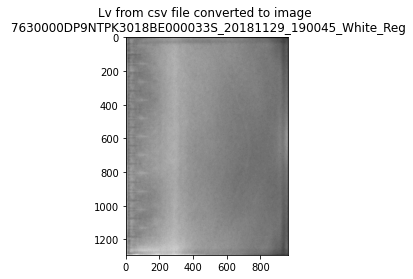

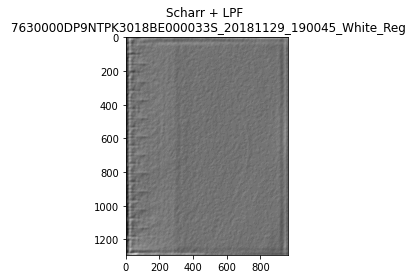

(1292, 962)
numrows: 1292
numCols: 962


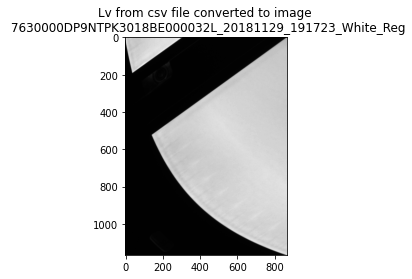

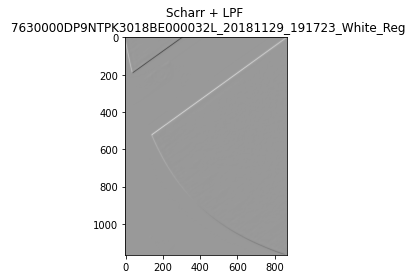

(1167, 869)
numrows: 1167
numCols: 869


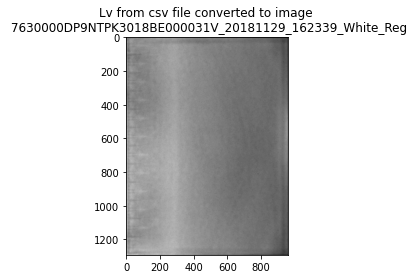

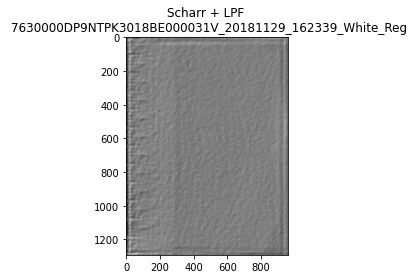

(1292, 962)
numrows: 1292
numCols: 962


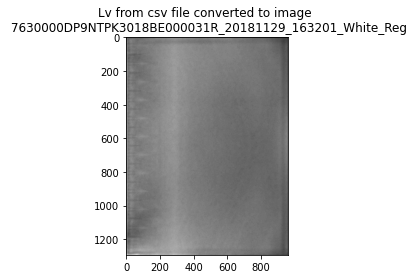

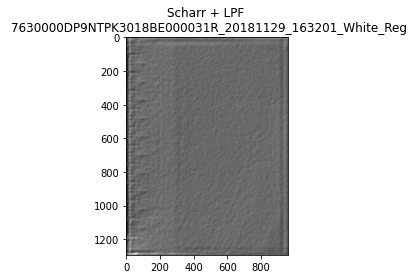

(1293, 963)
numrows: 1293
numCols: 963


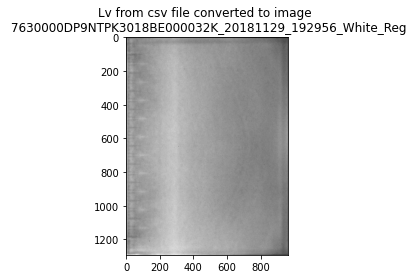

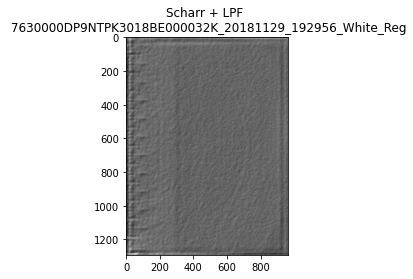

(1292, 962)
numrows: 1292
numCols: 962


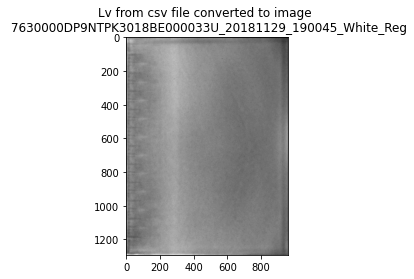

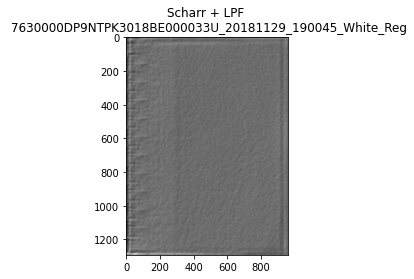

(1292, 962)
numrows: 1292
numCols: 962


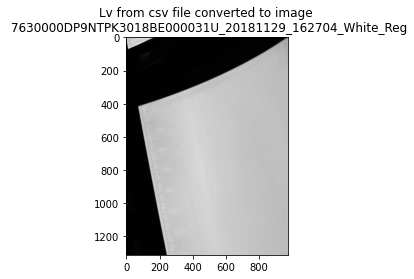

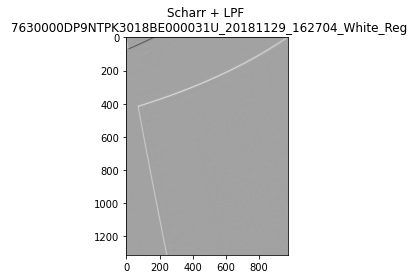

(1312, 977)
numrows: 1312
numCols: 977


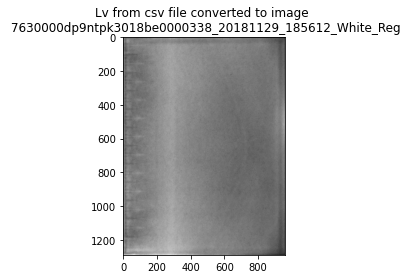

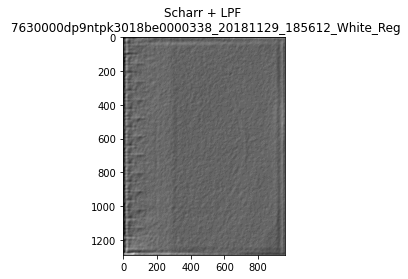

(1290, 960)
numrows: 1290
numCols: 960


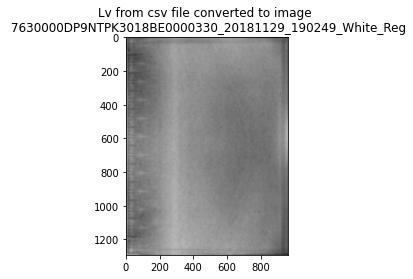

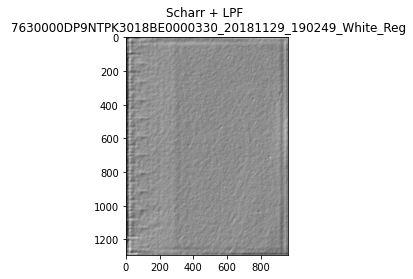

(1292, 962)
numrows: 1292
numCols: 962


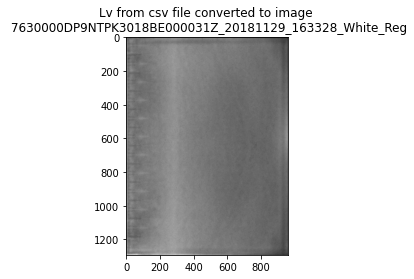

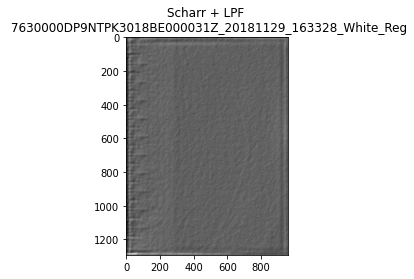

(1292, 962)
numrows: 1292
numCols: 962


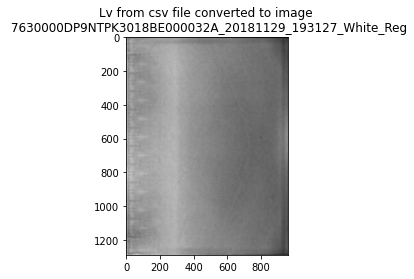

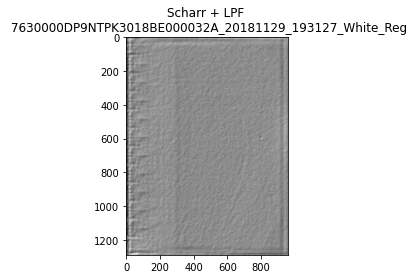

(1290, 961)
numrows: 1290
numCols: 961


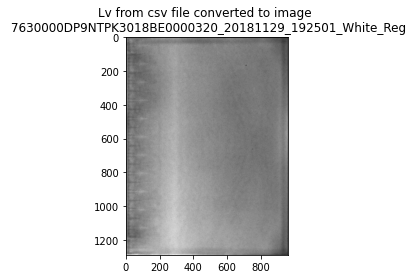

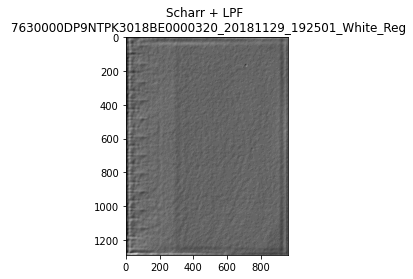

(1290, 961)
numrows: 1290
numCols: 961


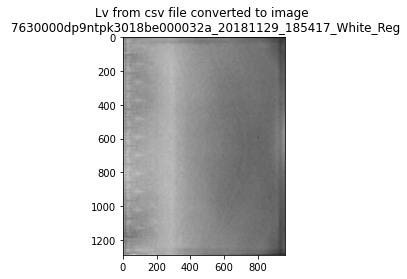

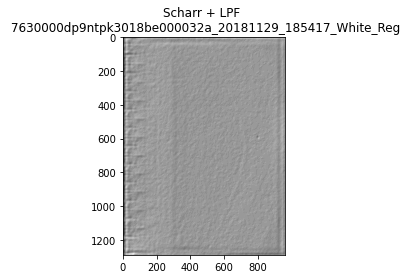

(1289, 960)
numrows: 1289
numCols: 960


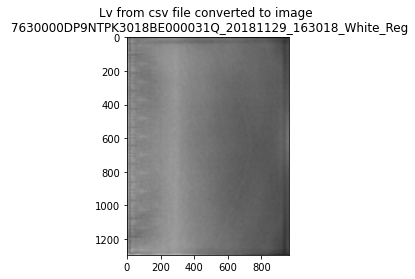

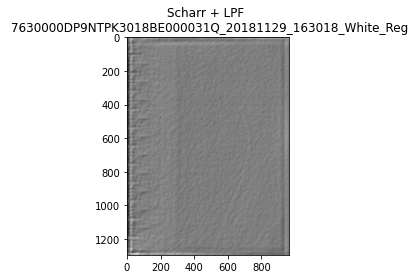

(1294, 963)
numrows: 1294
numCols: 963


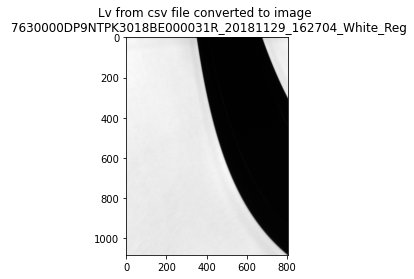

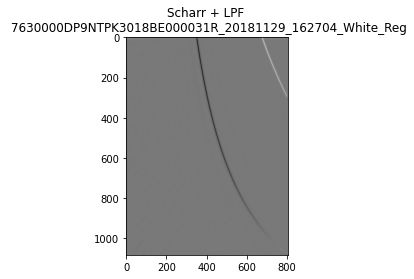

(1084, 807)
numrows: 1084
numCols: 807


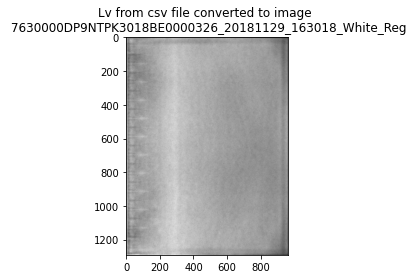

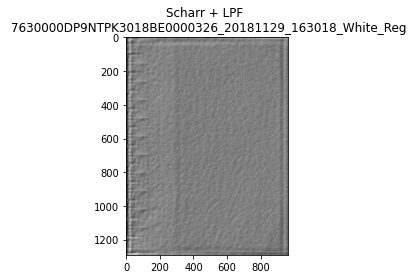

(1291, 961)
numrows: 1291
numCols: 961


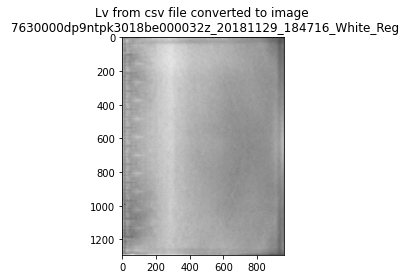

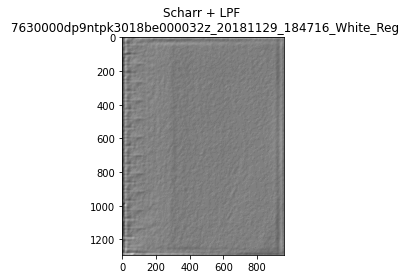

(1292, 962)
numrows: 1292
numCols: 962


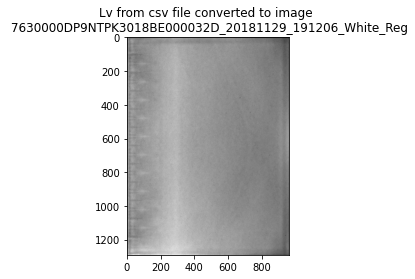

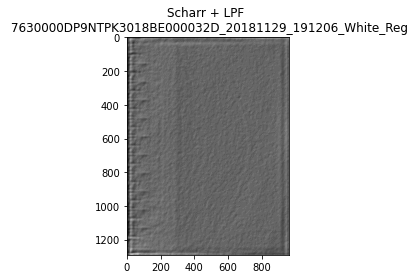

(1291, 961)
numrows: 1291
numCols: 961


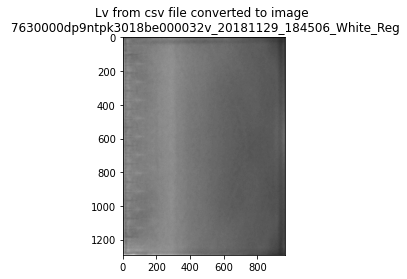

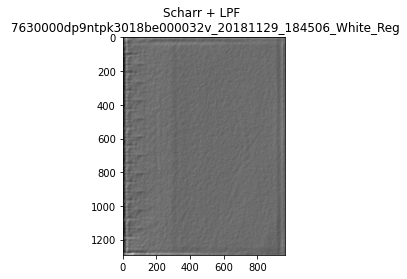

(1291, 961)
numrows: 1291
numCols: 961


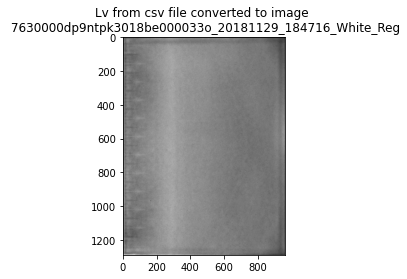

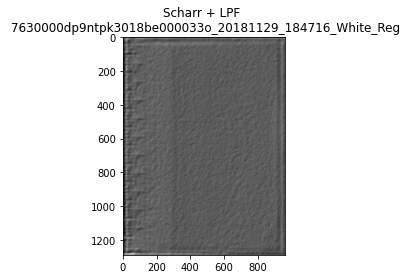

(1290, 961)
numrows: 1290
numCols: 961


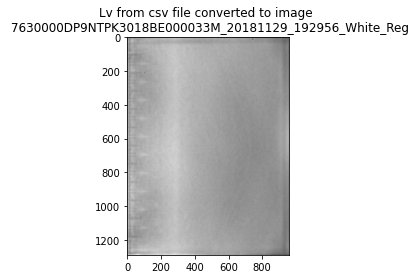

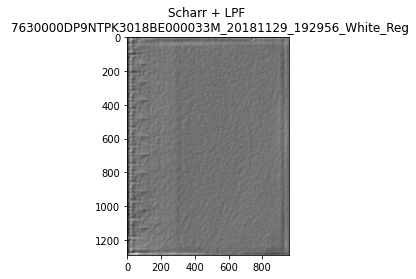

(1290, 960)
numrows: 1290
numCols: 960


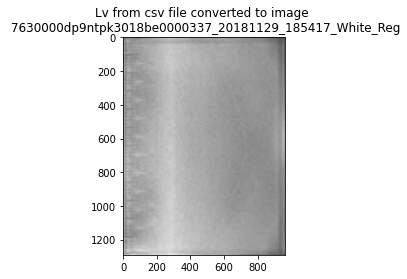

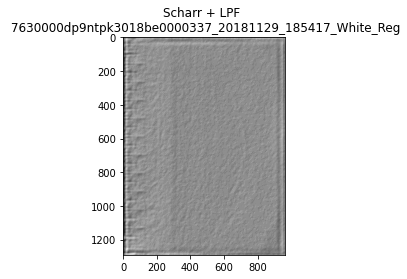

(1291, 961)
numrows: 1291
numCols: 961


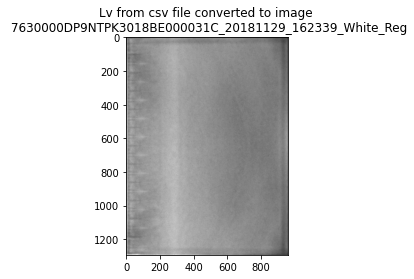

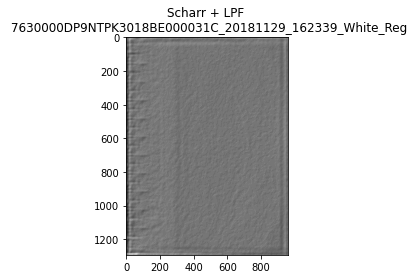

(1293, 963)
numrows: 1293
numCols: 963


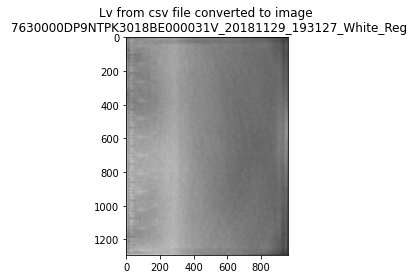

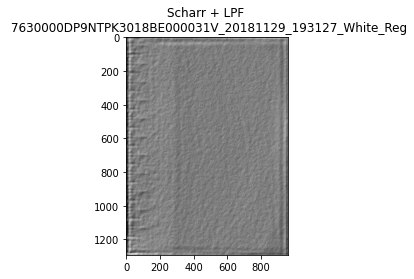

(1292, 962)
numrows: 1292
numCols: 962


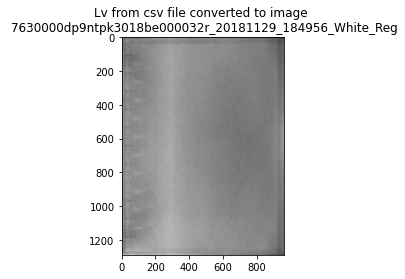

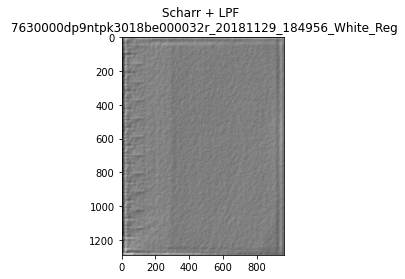

(1289, 960)
numrows: 1289
numCols: 960


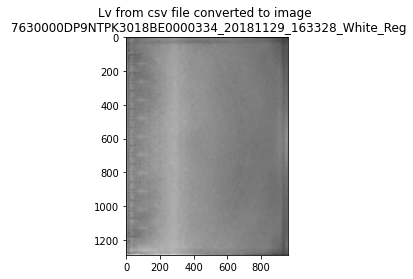

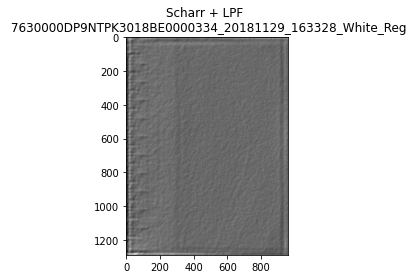

(1289, 960)
numrows: 1289
numCols: 960


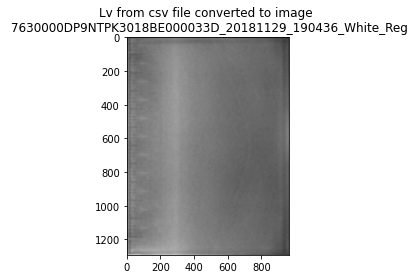

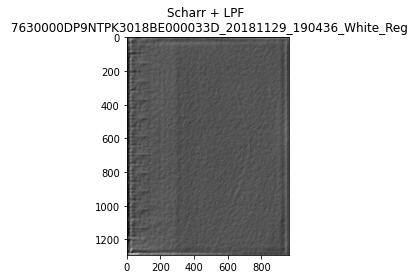

(1292, 962)
numrows: 1292
numCols: 962


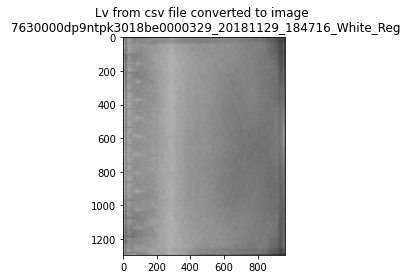

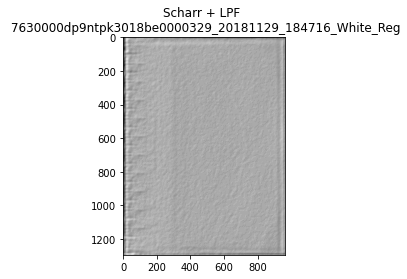

(1294, 963)
numrows: 1294
numCols: 963


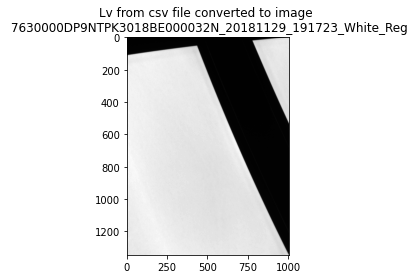

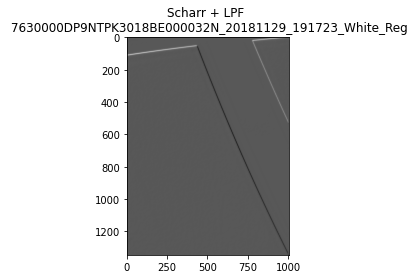

(1346, 1002)
numrows: 1346
numCols: 1002


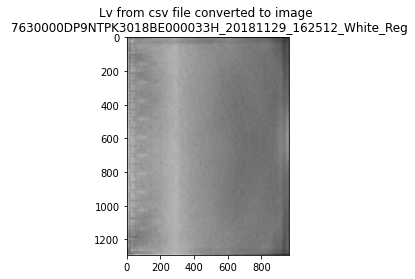

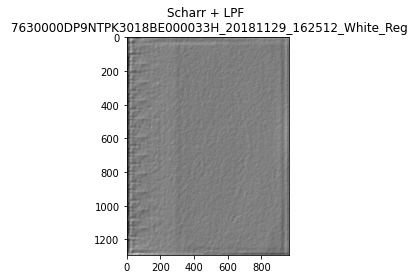

(1292, 962)
numrows: 1292
numCols: 962


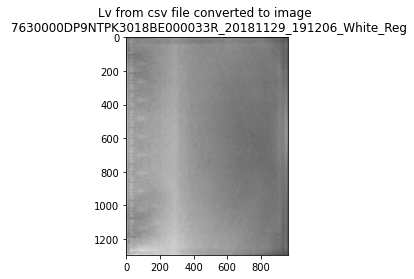

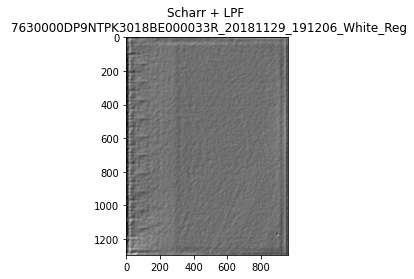

(1294, 964)
numrows: 1294
numCols: 964


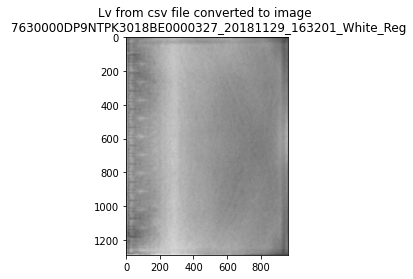

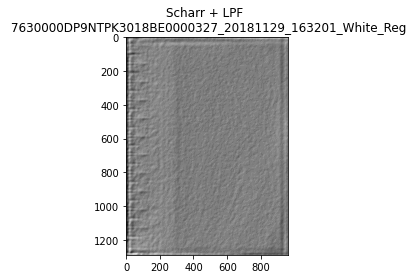

(1290, 960)
numrows: 1290
numCols: 960


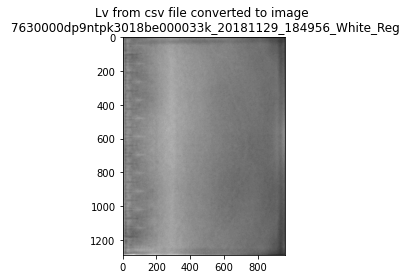

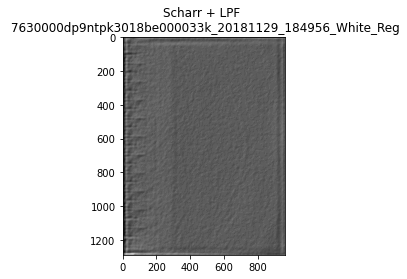

(1289, 960)
numrows: 1289
numCols: 960


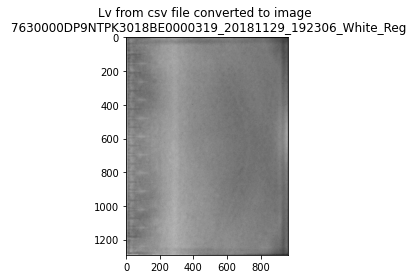

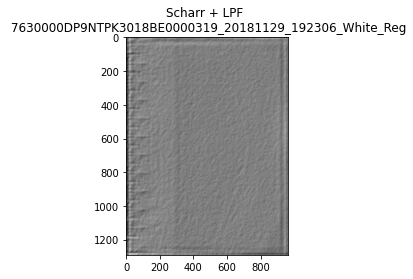

(1291, 961)
numrows: 1291
numCols: 961


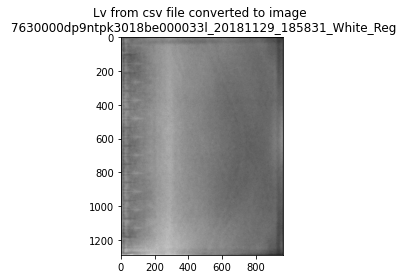

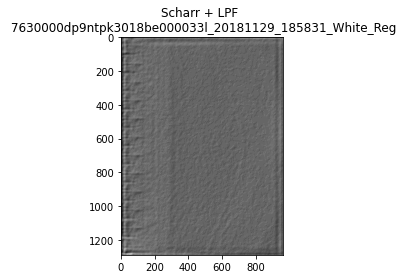

(1290, 961)
numrows: 1290
numCols: 961


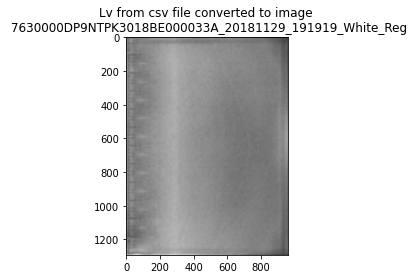

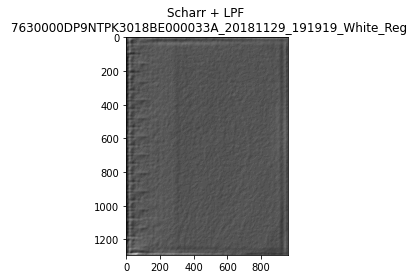

(1292, 962)
numrows: 1292
numCols: 962


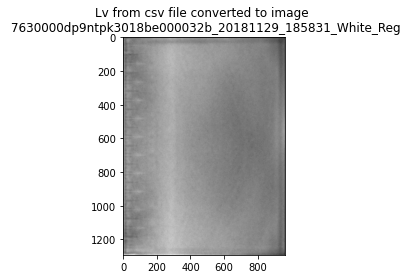

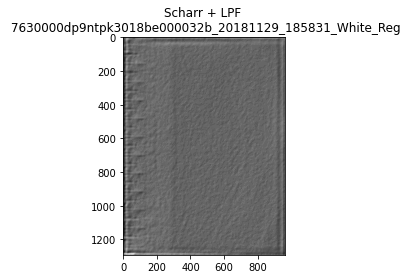

(1292, 962)
numrows: 1292
numCols: 962


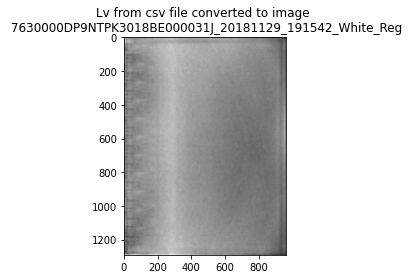

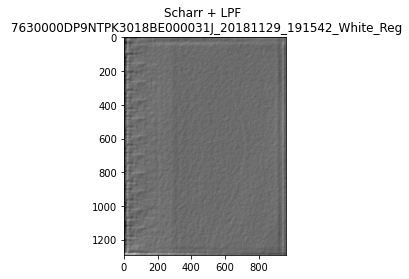

(1291, 961)
numrows: 1291
numCols: 961


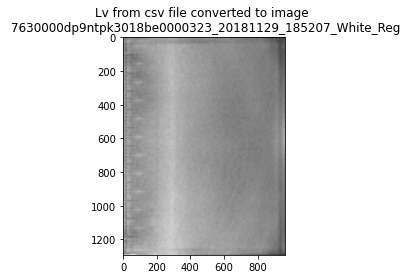

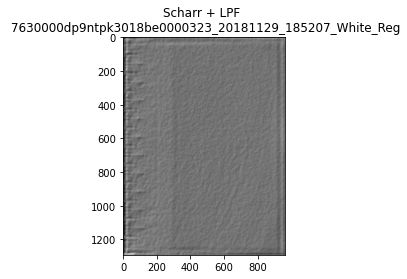

(1292, 962)
numrows: 1292
numCols: 962


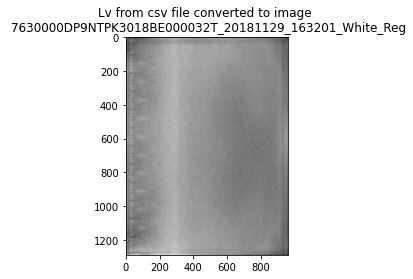

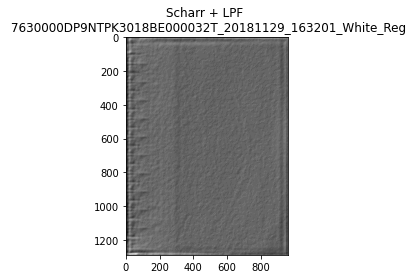

(1290, 961)
numrows: 1290
numCols: 961


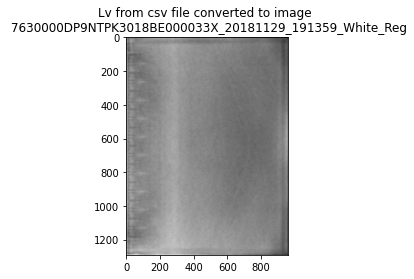

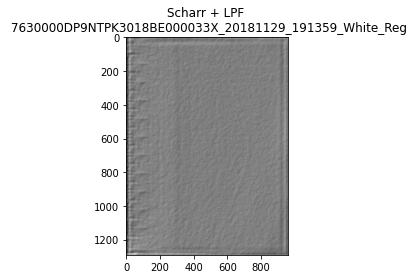

(1291, 961)
numrows: 1291
numCols: 961


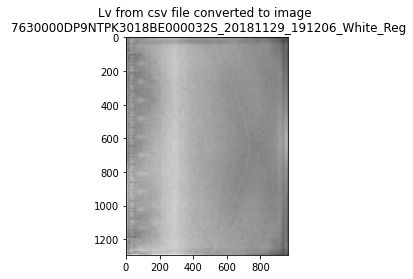

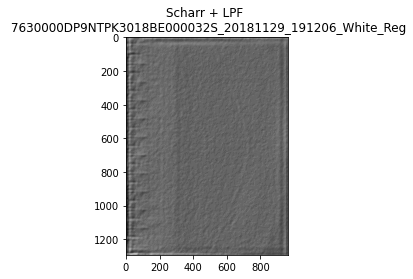

(1293, 963)
numrows: 1293
numCols: 963


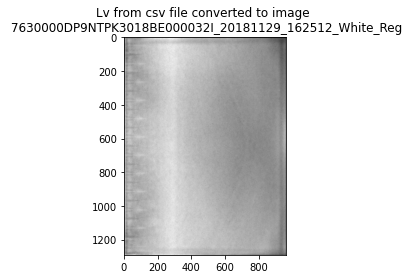

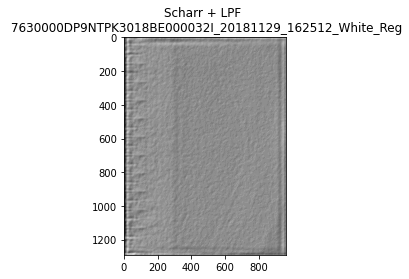

(1291, 961)
numrows: 1291
numCols: 961


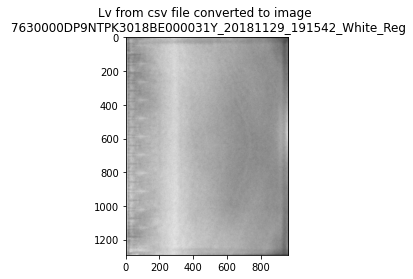

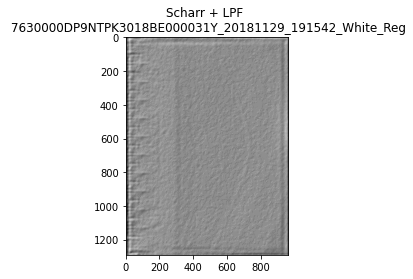

(1291, 962)
numrows: 1291
numCols: 962


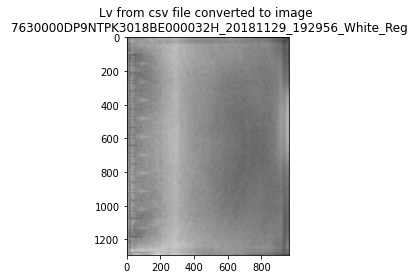

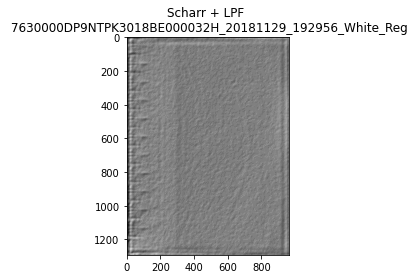

(1292, 962)
numrows: 1292
numCols: 962


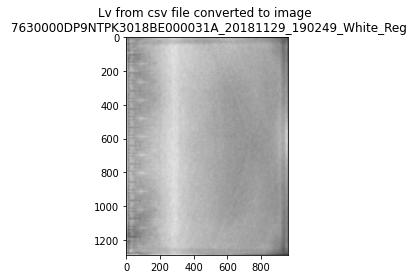

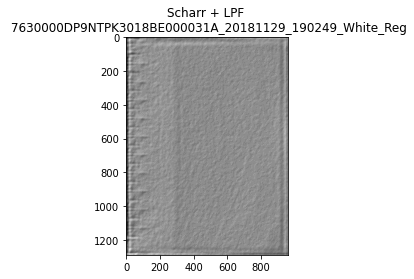

(1290, 961)
numrows: 1290
numCols: 961


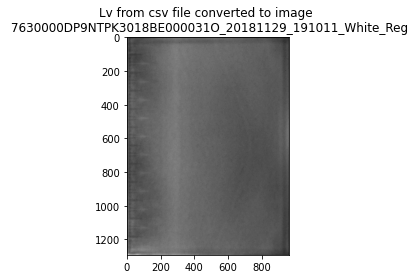

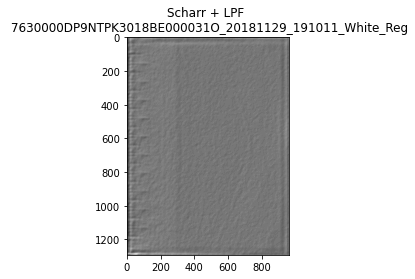

(1292, 962)
numrows: 1292
numCols: 962


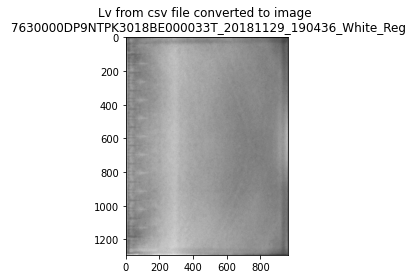

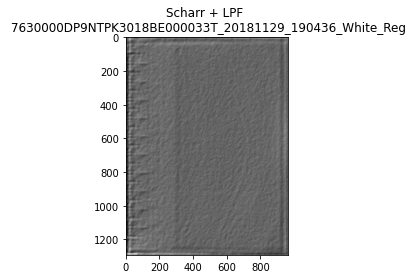

(1292, 962)
numrows: 1292
numCols: 962


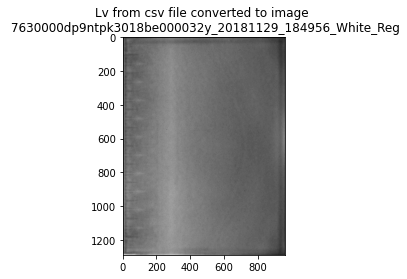

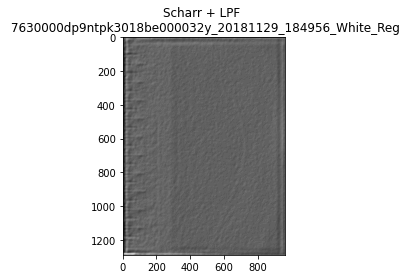

(1290, 961)
numrows: 1290
numCols: 961


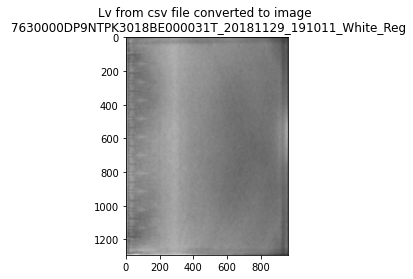

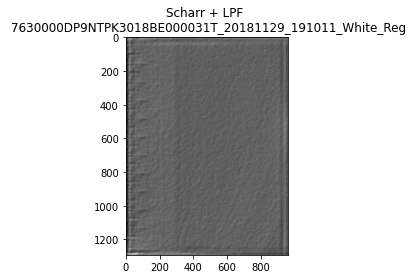

(1292, 962)
numrows: 1292
numCols: 962


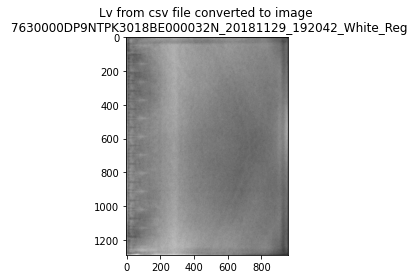

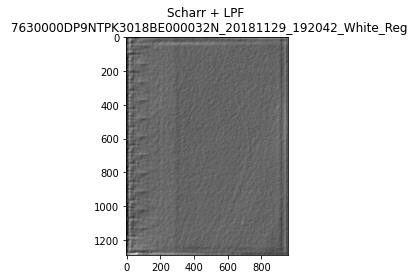

(1290, 961)
numrows: 1290
numCols: 961


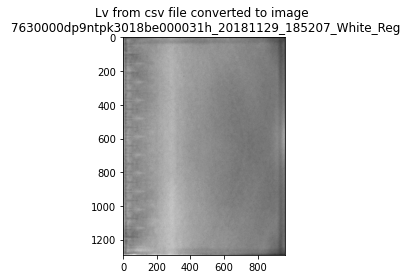

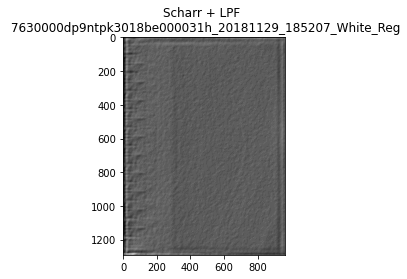

(1291, 961)
numrows: 1291
numCols: 961


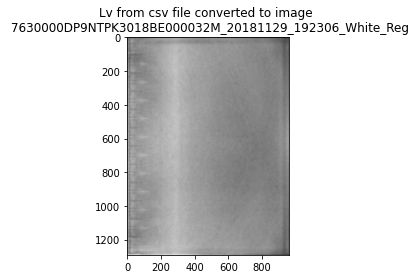

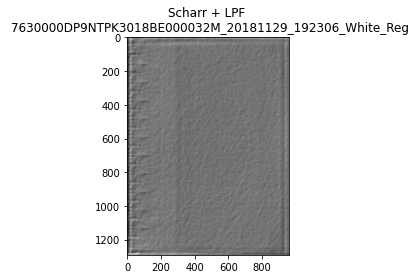

(1291, 961)
numrows: 1291
numCols: 961


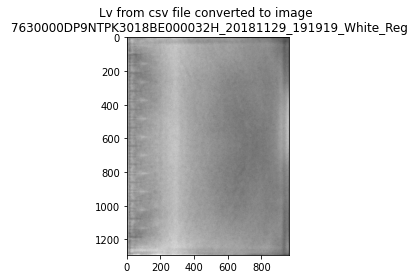

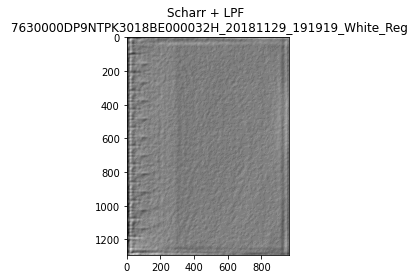

(1292, 962)
numrows: 1292
numCols: 962


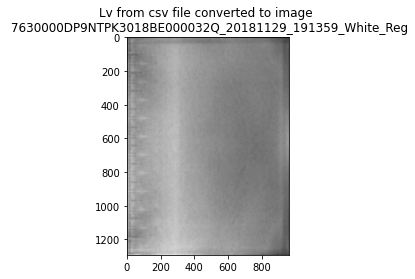

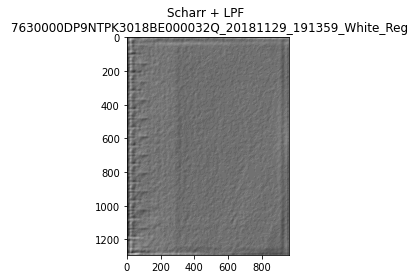

(1292, 962)
numrows: 1292
numCols: 962


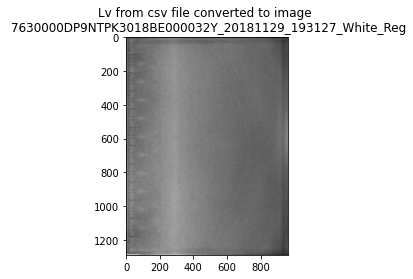

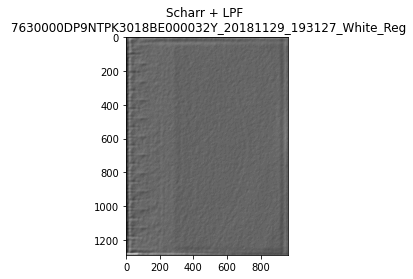

(1290, 960)
numrows: 1290
numCols: 960


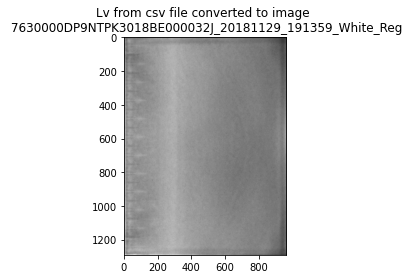

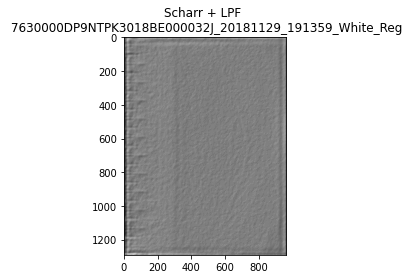

(1291, 962)
numrows: 1291
numCols: 962


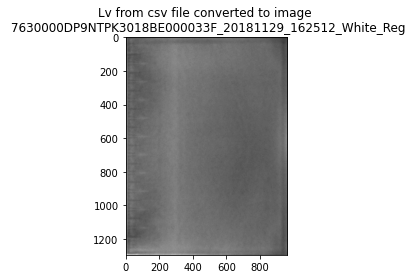

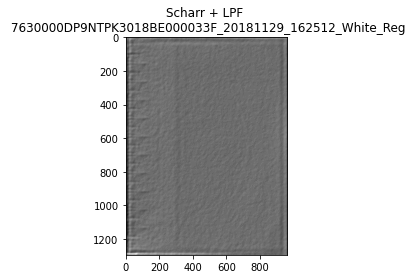

(1294, 963)
numrows: 1294
numCols: 963


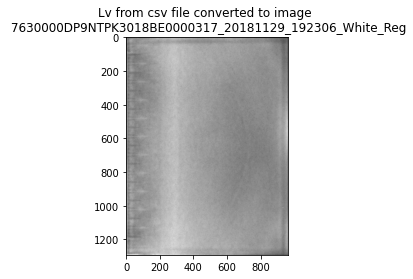

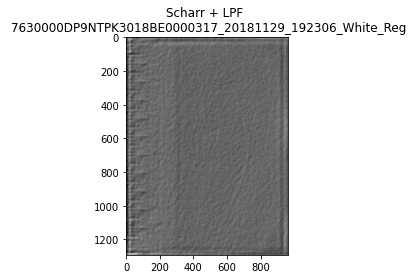

(1292, 962)
numrows: 1292
numCols: 962


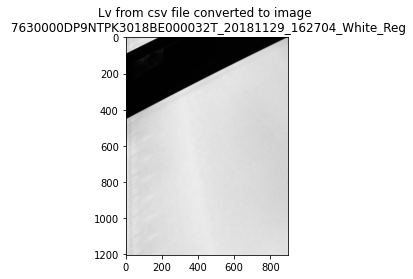

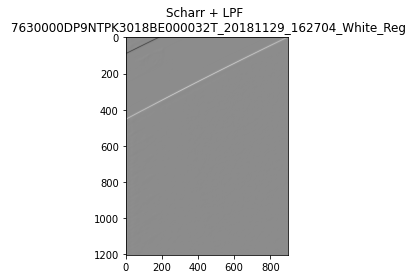

(1204, 897)
numrows: 1204
numCols: 897


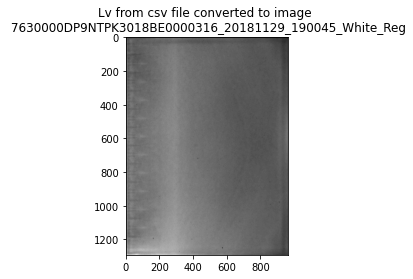

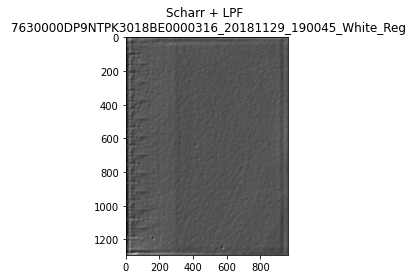

(1292, 962)
numrows: 1292
numCols: 962


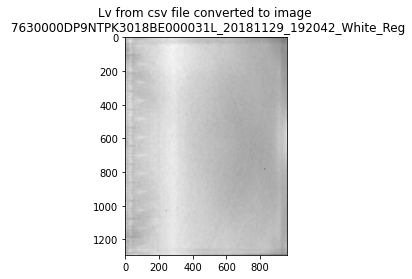

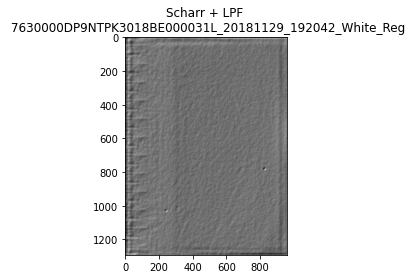

(1292, 962)
numrows: 1292
numCols: 962


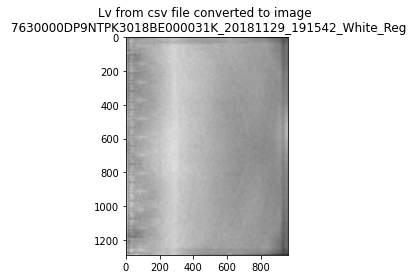

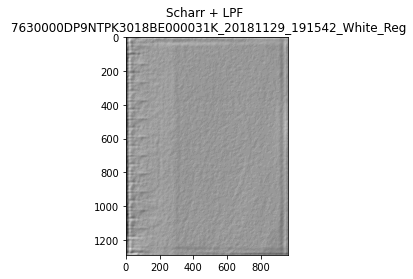

(1290, 961)
numrows: 1290
numCols: 961


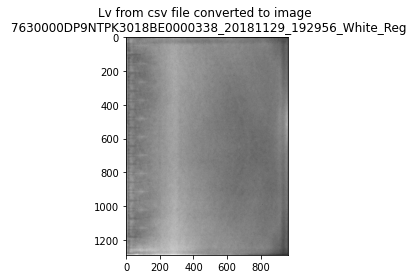

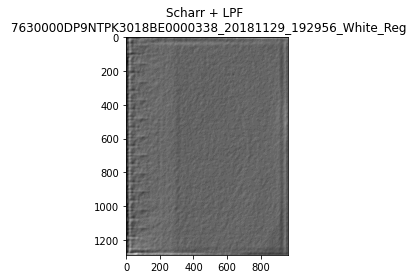

(1290, 961)
numrows: 1290
numCols: 961


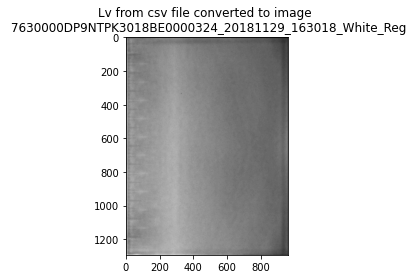

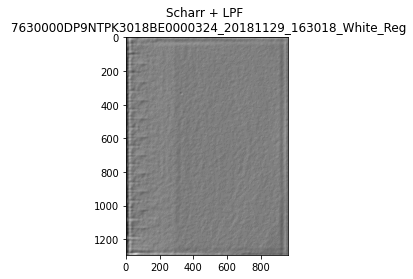

(1293, 963)
numrows: 1293
numCols: 963


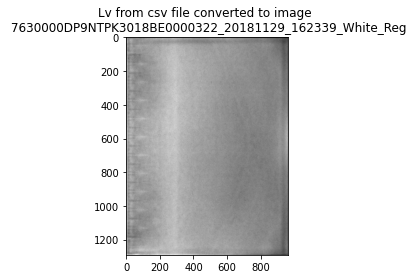

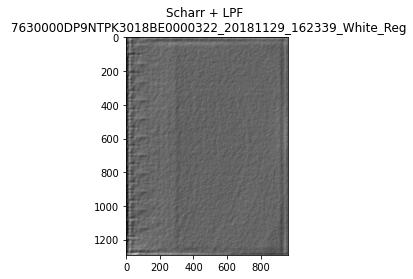

(1291, 961)
numrows: 1291
numCols: 961


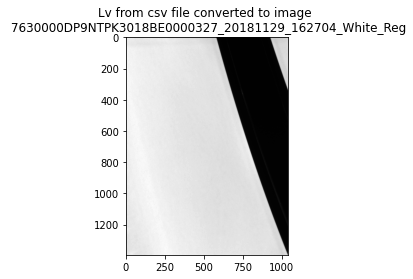

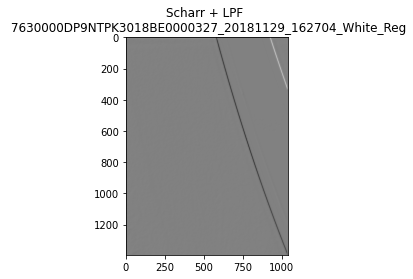

(1394, 1038)
numrows: 1394
numCols: 1038


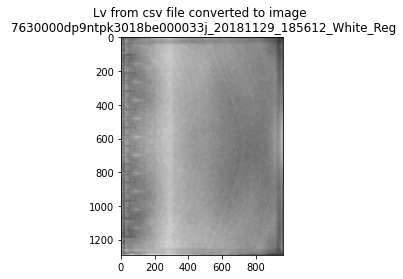

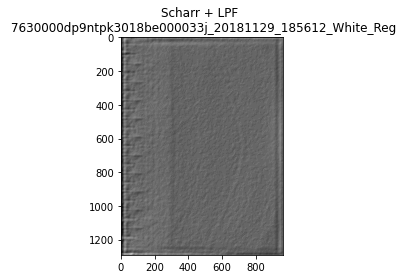

(1291, 961)
numrows: 1291
numCols: 961


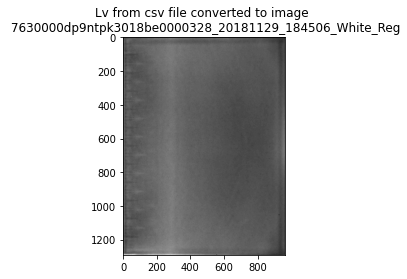

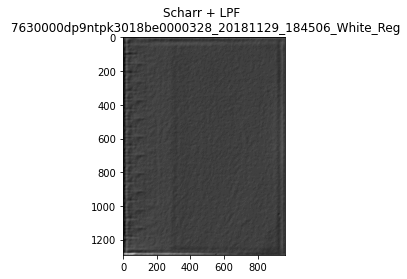

(1291, 961)
numrows: 1291
numCols: 961


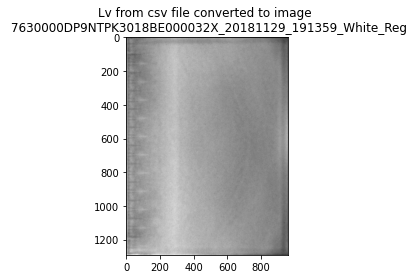

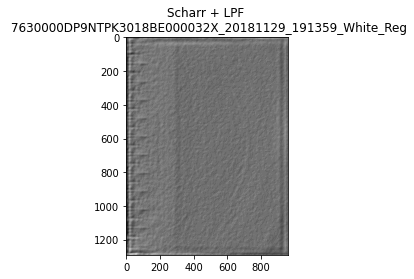

(1291, 961)
numrows: 1291
numCols: 961


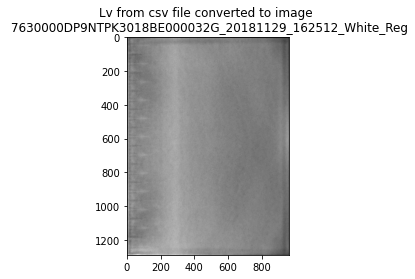

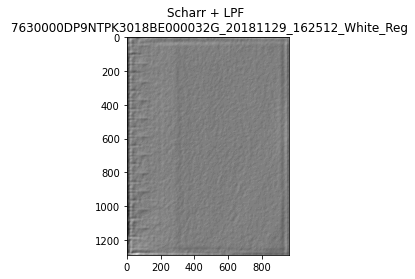

(1290, 961)
numrows: 1290
numCols: 961


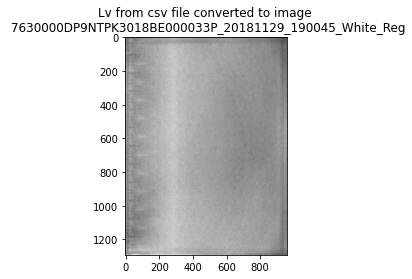

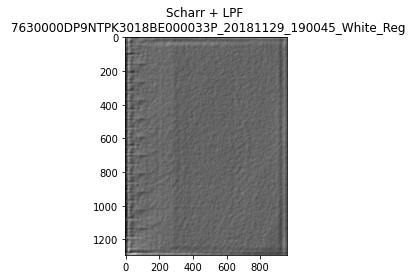

(1292, 962)
numrows: 1292
numCols: 962


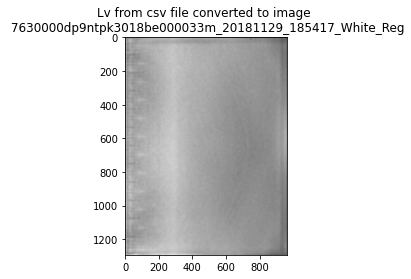

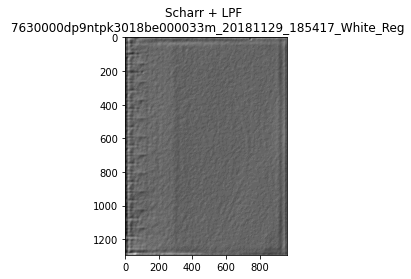

(1293, 963)
numrows: 1293
numCols: 963


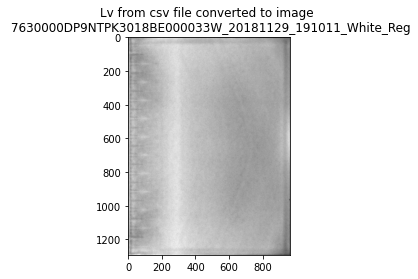

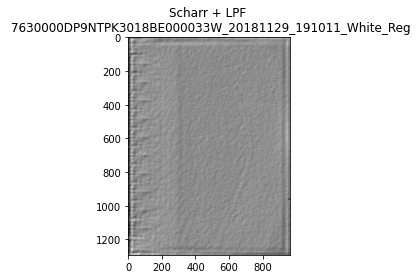

(1292, 962)
numrows: 1292
numCols: 962


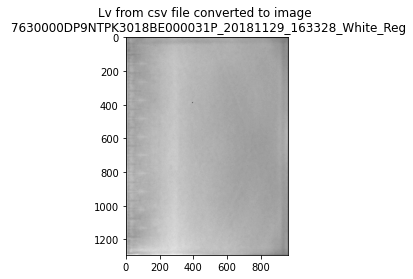

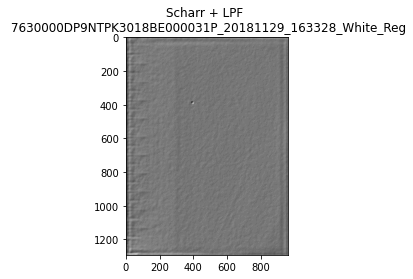

(1292, 962)
numrows: 1292
numCols: 962


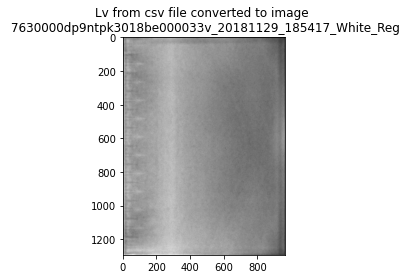

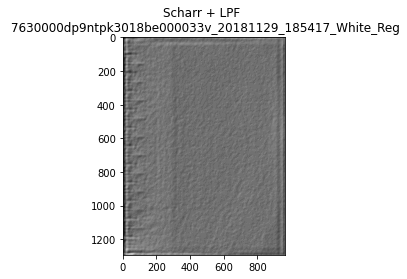

(1293, 963)
numrows: 1293
numCols: 963


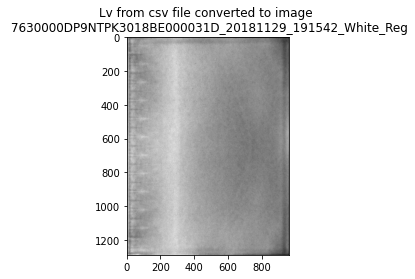

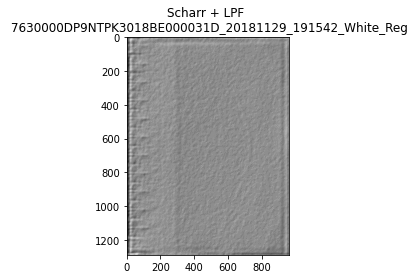

(1290, 961)
numrows: 1290
numCols: 961


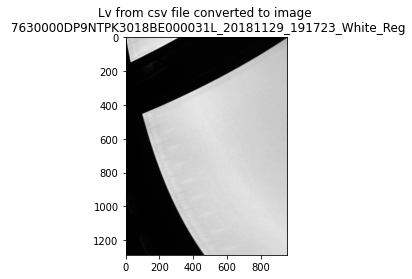

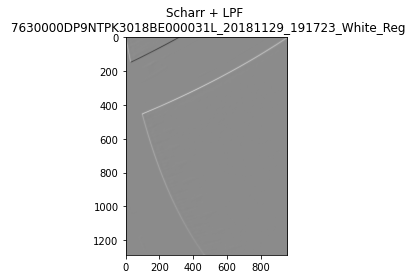

(1287, 958)
numrows: 1287
numCols: 958


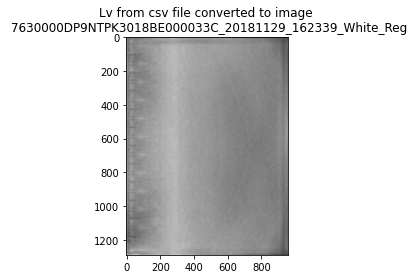

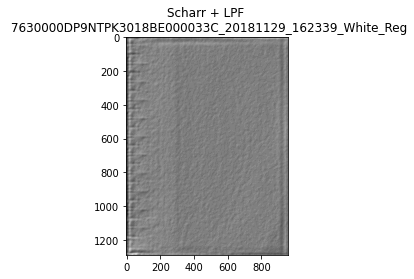

(1290, 960)
numrows: 1290
numCols: 960


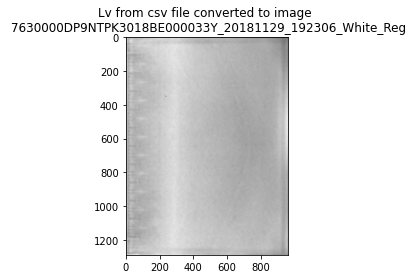

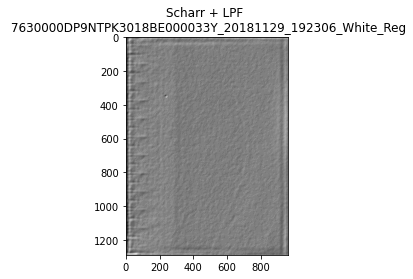

(1289, 960)
numrows: 1289
numCols: 960


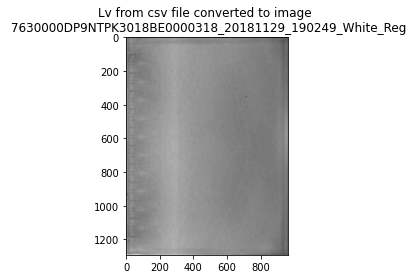

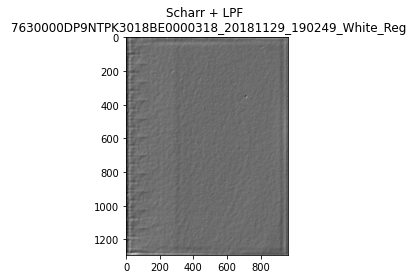

(1292, 962)
numrows: 1292
numCols: 962


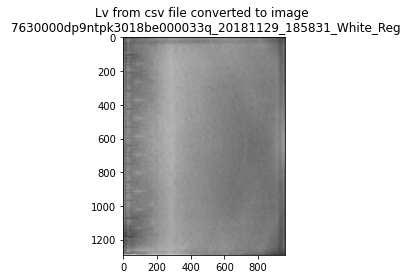

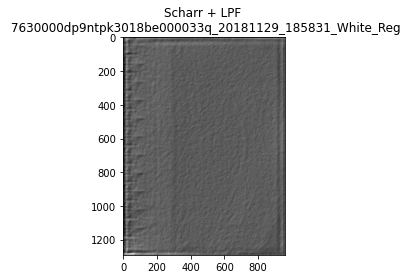

(1291, 961)
numrows: 1291
numCols: 961


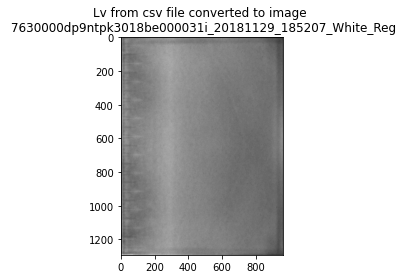

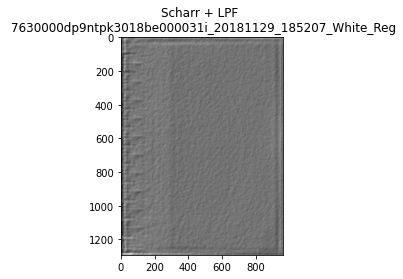

(1292, 962)
numrows: 1292
numCols: 962


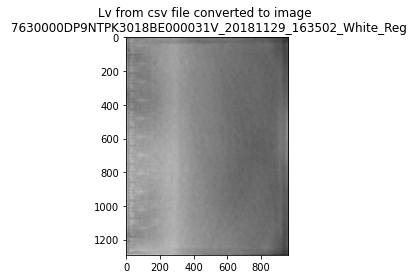

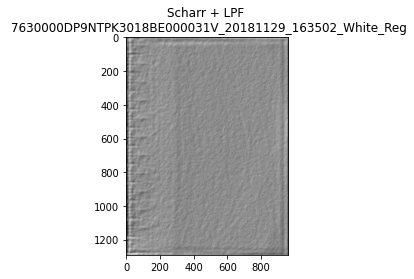

(1291, 962)
numrows: 1291
numCols: 962


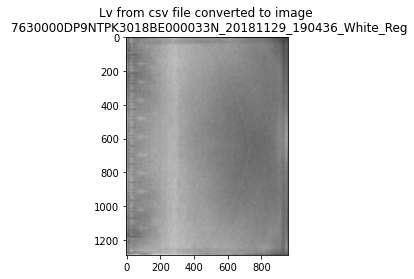

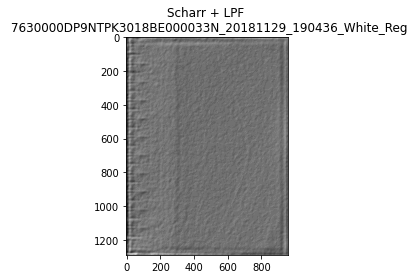

(1290, 961)
numrows: 1290
numCols: 961


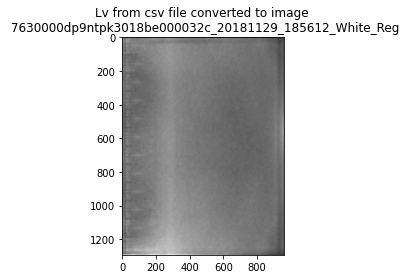

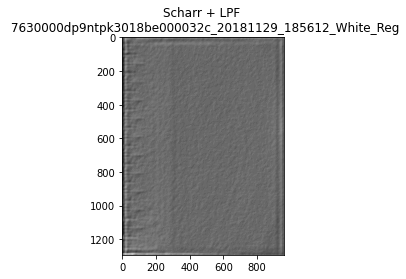

(1293, 963)
numrows: 1293
numCols: 963


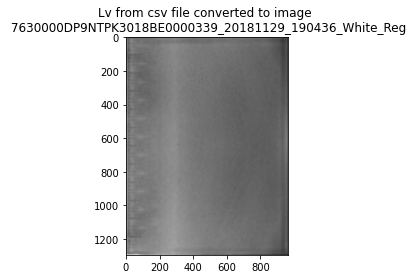

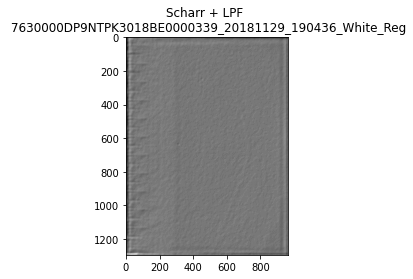

(1294, 963)
numrows: 1294
numCols: 963


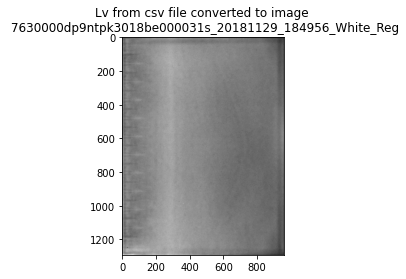

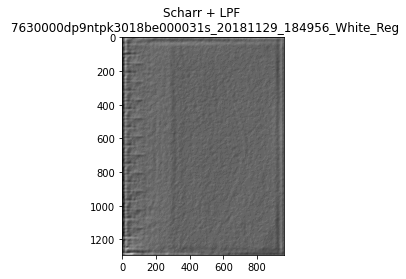

(1292, 962)
numrows: 1292
numCols: 962


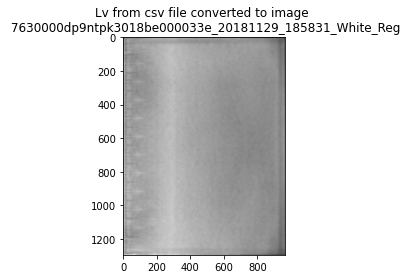

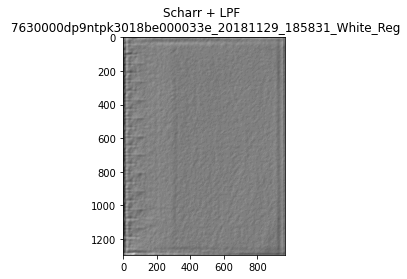

(1294, 963)
numrows: 1294
numCols: 963


ValueError: Unrecognized character 0 in format string

<Figure size 432x288 with 0 Axes>

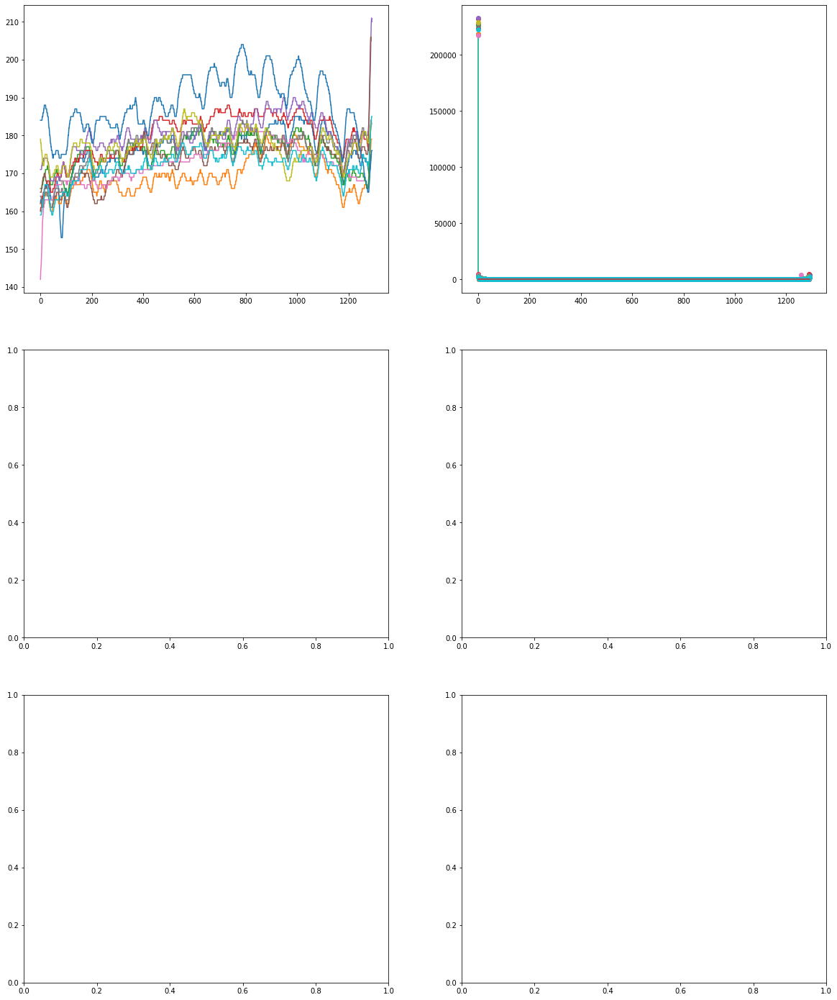

In [82]:
#path = '/Users/estepark/Documents/week11_mon/Vermouth_DVT/20190412D DVT DNC1-A/20190412/Data/HiResMesh/White'
path = '/Users/estepark/Documents/week11_mon/Vermouth_EVT/20181129D EVT EDN1-A/20181129/Data/HiResMesh/White'
#path = '/Users/estepark/Documents/week11_mon/Vermouth_HVT/2018-09-10 D HVT HG8A/20180910/Data/HiResMesh/White'
# row 500, 1275, 1350
os.path.isdir(path)
subPlotLong(path, plotRows=[0, 25, 50])

In [84]:
# long crosshatch plots SUBPLOTS FOR FINDING THE THRESHOLD
"""
subPlotPlotLong will output the score of ea Long csv file image
"""
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
def subPlotPlotLong(path, plotRows=[]):
    pixelIntensities = []
    fftAmps = []
    fnames = []
    count = []
    imgLongScore = []
    for fname in (glob.glob(path+'/*.csv') or glob.glob(path+'/*.CSV')) :
        Lv_csv = pd.read_csv(fname, skiprows=[0], header=None)
        for i in range(0,1500):
            # find element's index corresponding to u'
            if ( Lv_csv[0][i] =="u'" ): 
                # save all Lv matrix values until u' index
                Lvindex = int(np.where(Lv_csv == Lv_csv[0][i])[0] ) 
                break     # as soon as matched index valid, exit & search no further
        # concatenated Lv matrix that excludes u' and v' matrix in csv file
        Lv = np.array(Lv_csv[0: Lvindex], dtype="float32" ) 
        """
        INPUT == Short cross hatches
        FN == Short cross hatch search
        OUTPUT == ALL THE SUBPLOTS AND SHIET
        """
        # split the name of the csv as plt title
        spltName = fname.split('/')[-1][:-4] 
        fnames.append(spltName)
        #plt.figure()
        imgLv = np.array(Lv, dtype = "uint8") #cv2 for 8u and 32f images in function 'bilateralFilter'
        imgLvcopy = imgLv.copy()
        #cv.imread(Lv.x1)
        #plt.title("Lv from csv file converted to image \n {}".format(spltName))
        #plt.imshow(np.array(Lv), cmap="gray")
        #plt.show()

        # provide Scharr kernel
        kern = [[0, 1,  0], [1, 0, -1],[ 0, -1 ,0]]
        imgrayLv = cv.bilateralFilter(imgLv, 20, 75, 75)
        diag_imgLv= signal.convolve2d(imgrayLv, np.array(kern) , boundary ='symm', mode='same')
        #plt.figure()
        #plt.imshow(diag_imgLv, cmap = "gray")
        #plt.title("Scharr + LPF \n {}".format(spltName))
        #plt.show()

        # scale back to [0,255], becuase convolve2d changes ranges [-2,+2]
        diag_cpy = (((diag_imgLv.copy()+2))/4*255).astype(np.uint8) #bc min=-2 and max=+2
        #print('max = {}, min = {}'.format(np.max(diag_cpy), np.min(diag_cpy)))  #confirm min/max
        #print(' diag shape = ',diag_cpy.shape) 
        edged = cv.Canny(diag_cpy, 160, 230)

        #sobelx = cv.Sobel(diag_cpy,cv.CV_64F,0,1,ksize=5)
        #plt.figure()
        #plt.imshow(diag_cpy)
        #plt.title('diag_cpy scaled to 0,255')
        #plt.show()
        #==================================================
        # perform short crosshatch # FFT scores vs. # row slice, around row #1200 should see period 
        #==================================================
        samplingFreq = 100
        samplingInterval = 1 / samplingFreq
        beginTime = 0
        #print(imgLv.shape)
        """
        numRows == len of col is a 1360(height)x1020(width), then 1360==len of col == #of rows
        """
        numRows = imgLv.shape[0] 
        numCols = imgLv.shape[1]
        # for loop for short crosshatch is endTime = numCol
        #freqRowSamps = np.linspace(0, numCols, numCols) # for short crosshatch
        freqRowSamps = np.linspace(0, numRows, numRows) # for short crosshatch
        endTime = numRows
        teim = np.arange(beginTime,endTime, 1)
        countPeaks = [] 
        score = []
        #print("numrows: {}" .format(imgLv.shape[0]))
        #print("numCols: {}" .format(imgLv.shape[1]))

        filePixelIntensities = []
        fileFftAmps = []
        for i in range(numCols):
        #for i in plotRows: 
            # for every i'th row, slice all columns [i,:]: => and append into amplitude 
            #amplitude = imgrayLv[i,:] # ampltiude == # of cols, for short crosshatch
            amplitude = imgrayLv[:,i] # ampltiude == # of cols, for short crosshatch
            filePixelIntensities.append(amplitude)
            #================================================================================
            #time domain representation for CrossHatch periodic signal
            #================================================================================
            #plt.figure()
            #plt.title('Row #%s' % (i) + " Spatial Intensity vs. Pixel distance \n{}".format(spltName) )
            #plt.xlabel('Pixel Distance along x-axis ')
            #plt.ylabel('Pixel intensity of Lv mat [Nits]')
            #plt.plot(amplitude)

            #=================================================================================
            #frequency domain of short CrossHatch
            # ---->https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html
            #=================================================================================
            #plt.figure()
            X = fftpack.fft(amplitude)
            fileFftAmps.append(np.abs(X))
            amplitude1 = fftpack.fftfreq(len(amplitude))*samplingFreq
        
            #plt.title('Row #%s' % (i) + " Abs FFT Magnitude vs. Frequency \n{}".format(spltName) )
            #plt.xlabel('Frequency along x-axis [cycles/image]')
            #plt.ylabel('Abs amplitude FFT')
            #plt.xlim(-1, samplingFreq / 2)
            #plt.ylim(-1, 4000)
            #plt.stem(freqRowSamps, np.abs(X), use_line_collection = True) 

            #=================================================================================
            #count number of peaks that surpass that threshold, dont xlim ylim
            #plt.subplots_adjust ( hspace = 3)     
            # https://pythonawesome.com/overview-of-the-peaks-dectection-algorithms-available-in-python/
            #=================================================================================
            freqPeaks = scipy.signal.find_peaks( np.abs(X) , distance=1, width=0, height=[250, 3000] )
            
            indexPeaks = freqPeaks[0]
            heightPeaks = freqPeaks[1]['peak_heights']
           

            if heightPeaks.size > 0:
                #plt.stem(indexPeaks,heightPeaks, use_line_collection=True)
                countPeaks.append(heightPeaks)
                #plt.show()
            else:
                countPeaks.append([0])

        countPeaks = np.array(countPeaks) 
        isCrossHatch = np.hstack(countPeaks) #flattend last of countPeaks
        
        score = sum(isCrossHatch)
        imgLongScore.append(score)
        #print("score is {}".format(score))
        sumCols = [np.sum(cp) for cp in countPeaks]
        count.append(sumCols)

    """
    plt.plot(count[0],'--', color='blue')
    plt.plot(count[1],'--', color='orange')
    plt.plot(count[2],'--', color = 'green')
    plt.xlabel('Column number')
    plt.ylabel('Sum of FFT magnitude')
    plt.title('Sum of FFT magnitudes vs. Column number')
    plt.legend(labels = ['5_20181126_102401_Mixed_Reg','5_20181126_102335_White_Reg','5_20181126_102349_Amber_Reg'],loc="upper right")
    plt.show()
    """
    return imgLongScore
path= '/Users/estepark/Documents/week6_fri/Data/'
# row 500, 1275, 1350
subPlotPlotLong(path, plotRows=[0, 100, 700])



[3015536.5923136566, 3875370.419616008, 2898055.40605237]

(30, 244)


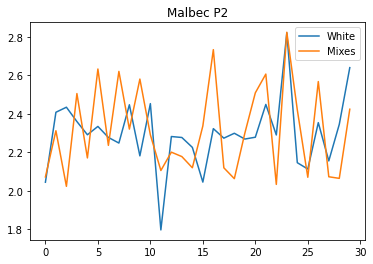

In [51]:
import pandas as pd
import numpy as np
import os, glob
import matplotlib.pyplot as plt
metricPath = '/Users/estepark/Documents/week6_fri/Currentmetrics/'
def metrics(path) :
    for fname in (glob.glob(path+'/*.csv')) :
        crosshatch = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
        
        
        #print(crosshatch)
        print(crosshatch.shape)
        #print(crosshatch.iloc[0])
        #print(crosshatch.columns.values)
        #for i in range(len(crosshatch.iloc[0])): 
        #    if crosshatch.iloc[0][i] == 'Crosshatch': 
        #        print(i,':',crosshatch.iloc[0][i])
        #print(crosshatch['White Metric1 Value'])
        #print(crosshatch['Amber Metric1 Value'])
        #print(crosshatch['Mixed Metric1 Value'])
        plt.figure()
        plt.title('Malbec P2')
        plt.plot(crosshatch['White Metric1 Value'], label='White')
        #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
        plt.plot(crosshatch['Mixed Metric1 Value'], label='Mixes')
        plt.legend()
        plt.show()
metrics(metricPath)


(49, 235)


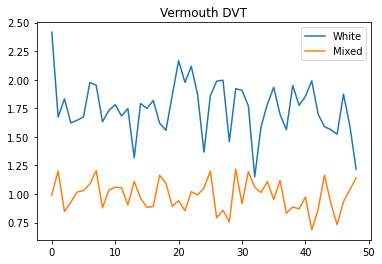

(57, 246)


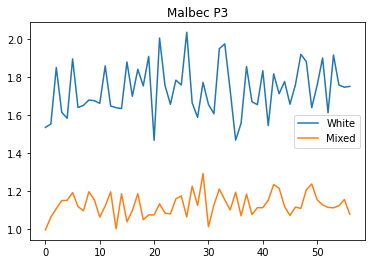

(30, 244)


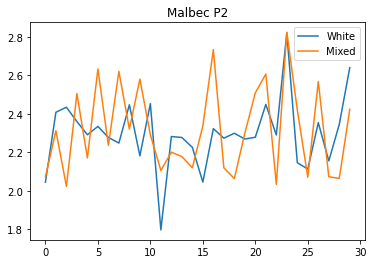

(97, 217)


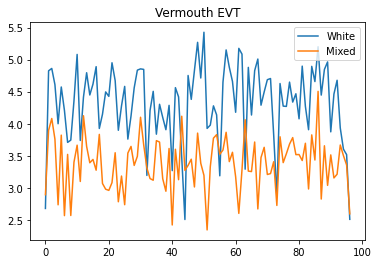

(255, 217)


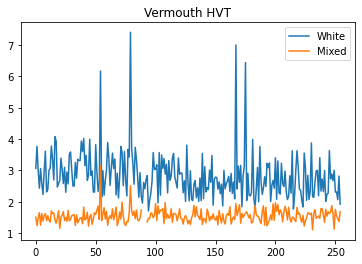

In [91]:
import pandas as pd
import numpy as np
import os, glob
import matplotlib.pyplot as plt
metricPath = '/Users/estepark/Documents/week6_fri/Currentmetrics/'
def metrics(path) :
    for fname in (glob.glob(path+'/*.csv')) :
        if (fname == metricPath+'Summary_20200623D P3 PSMC TPK_20200623.csv'):
            crosshatchP3 = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
            print(crosshatchP3.shape)
            plt.figure()
            plt.title('Malbec P3')
            plt.plot(crosshatchP3['White Metric1 Value'], label='White')
            #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
            plt.plot(crosshatchP3['Mixed Metric1 Value'], label='Mixed')
            plt.legend()
            plt.show()
        elif (fname == metricPath+'Summary_20200330D P2 SOP1 TPK_20200330.csv'):
            crosshatchP2 = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
            print(crosshatchP2.shape)
            plt.figure()
            plt.title('Malbec P2')
            plt.plot(crosshatchP2['White Metric1 Value'], label='White')
            #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
            plt.plot(crosshatchP2['Mixed Metric1 Value'], label='Mixed')
            plt.legend()
            plt.show()
        elif (fname == metricPath+'Summary_2018-09-10 D HVT HG8A_20180910.csv'):
            crosshatchHVT = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
            print(crosshatchHVT.shape)
            plt.figure()
            plt.title('Vermouth HVT')
            plt.plot(crosshatchHVT['White Metric1 Value'], label='White')
            #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
            plt.plot(crosshatchHVT['Mixed Metric1 Value'], label='Mixed')
            plt.legend()
            plt.show()
        elif (fname == metricPath+'Summary_20181129D EVT EDN1-A_20181129.csv'):
            crosshatchEVT = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
            print(crosshatchEVT.shape)
            plt.figure()
            plt.title('Vermouth EVT')
            plt.plot(crosshatchEVT['White Metric1 Value'], label='White')
            #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
            plt.plot(crosshatchEVT['Mixed Metric1 Value'], label='Mixed')
            plt.legend()
            plt.show()
        elif (fname == metricPath+'Summary_20190412D DVT DNC1-A_20190412.csv'):
            crosshatchDVT = pd.read_csv(fname, skiprows=[0,1,2,3,4], header=0)
            print(crosshatchDVT.shape)
            plt.figure()
            plt.title('Vermouth DVT')
            plt.plot(crosshatchDVT['White Metric1 Value'], label='White')
            #plt.plot(crosshatch['Amber Metric1 Value'], label='Amber')
            plt.plot(crosshatchDVT['Mixed Metric1 Value'], label='Mixed')
            plt.legend()
            plt.show()            
metrics(metricPath)

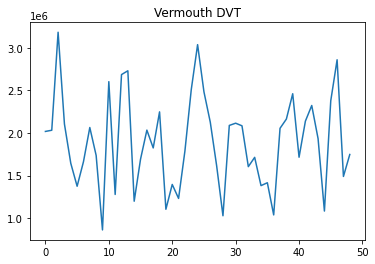

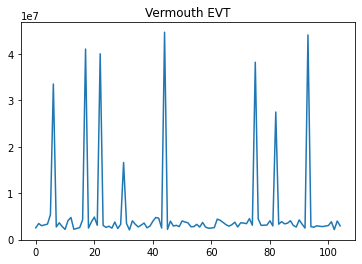

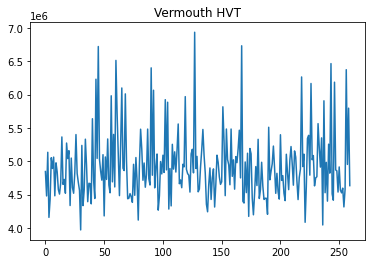

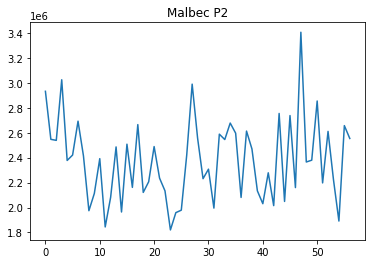

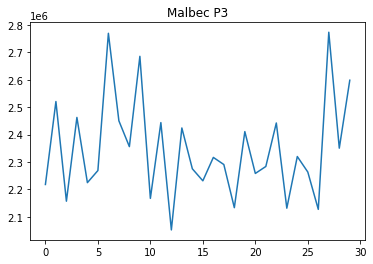

In [90]:
#csv
pathDVT = '/Users/estepark/Documents/week11_mon/Vermouth_DVT/20190412D DVT DNC1-A/20190412/Data/HiResMesh/White'
#csv
pathEVT= '/Users/estepark/Documents/week11_mon/Vermouth_EVT/20181129D EVT EDN1-A/20181129/Data/HiResMesh/White'
# CSV
pathHVT= '/Users/estepark/Documents/week11_mon/Vermouth_HVT/2018-09-10 D HVT HG8A/20180910/Data/HiResMesh/White'
pathP3 = '/Users/estepark/Documents/week11_mon/Martini_Proto3/20200623D P3 PSMC TPK/Summary_20200623D P3 PSMC TPK_20200623/Data/HiResMesh/White'
pathP2 = '/Users/estepark/Documents/week11_mon/Martini_Proto2/20200330D P2 SOP1 TPK/Summary_20200330D P2 SOP1 TPK_20200330/Data/HiResMesh/White'

DVTscore =  subPlotPlotLong(pathDVT, plotRows=[0])
EVTscore =  subPlotPlotLong(pathEVT, plotRows=[0])
HVTscore =  subPlotPlotLong(pathHVT, plotRows=[0])
P3score = subPlotPlotShort(pathP2, plotRows=[0])
P2score = subPlotPlotShort(pathP3, plotRows=[0])

plt.figure()
plt.title('Vermouth DVT')
plt.plot(DVTscore)
plt.show()  

plt.figure()
plt.title('Vermouth EVT')
plt.plot(EVTscore)
plt.show() 

plt.figure()
plt.title('Vermouth HVT')
plt.plot(HVTscore)
plt.show()


plt.figure()
plt.title('Malbec P2')
plt.plot(P2score)
plt.show()


plt.figure()
plt.title('Malbec P3')
plt.plot(P3score)
plt.show()